# Мартьянова Александра Евгеньевна, курс «Data Science», ВКР

### Кластеризация параметров

#### 1. Загрузка и подготовка датасета

In [778]:
# Загрузка разных библиотек
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler
import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
from sklearn.cluster import KMeans
from sklearn.cluster import AgglomerativeClustering 
from scipy.cluster import hierarchy 
from scipy.spatial import distance_matrix 
from sklearn.metrics import silhouette_score
from fcmeans import FCM
import scipy.stats as stats
import statistics
from scipy.stats import f_oneway

%matplotlib inline 

In [779]:
# Загрузка в объект DataFrame файла X_bp.xlsx, метод read_excel
x_bp = pd.read_excel('X_bp.xlsx', index_col = 0)
x_bp.head()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2"
0.0,1.857143,2030.0,738.736842,30.00,22.267857,100.000000,210.0,70.0,3000.0,220.0
1.0,1.857143,2030.0,738.736842,50.00,23.750000,284.615385,210.0,70.0,3000.0,220.0
2.0,1.857143,2030.0,738.736842,49.90,33.000000,284.615385,210.0,70.0,3000.0,220.0
3.0,1.857143,2030.0,738.736842,129.00,21.250000,300.000000,210.0,70.0,3000.0,220.0
4.0,2.771331,2030.0,753.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0


In [780]:
# Загрузка в объект DataFrame файла X_nup.xlsx, метод read_excel
x_nup = pd.read_excel('X_nup.xlsx', index_col = 0)
x_nup.head()

,"Угол нашивки, град",Шаг нашивки,Плотность нашивки
0.0,0.0,4.0,57.0
1.0,0.0,4.0,60.0
2.0,0.0,4.0,70.0
3.0,0.0,5.0,47.0
4.0,0.0,5.0,57.0


In [781]:
# соединение объектов DataFrame, метод merge, объединение по индексу, тип объединения INNER
df = x_bp.merge(x_nup, how = 'inner', left_index = True, right_index = True)
df.head()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0.0,1.857143,2030.0,738.736842,30.00,22.267857,100.000000,210.0,70.0,3000.0,220.0,0.0,4.0,57.0
1.0,1.857143,2030.0,738.736842,50.00,23.750000,284.615385,210.0,70.0,3000.0,220.0,0.0,4.0,60.0
2.0,1.857143,2030.0,738.736842,49.90,33.000000,284.615385,210.0,70.0,3000.0,220.0,0.0,4.0,70.0
3.0,1.857143,2030.0,738.736842,129.00,21.250000,300.000000,210.0,70.0,3000.0,220.0,0.0,5.0,47.0
4.0,2.771331,2030.0,753.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,0.0,5.0,57.0


In [782]:
# Изменение типа данных индекса, метод astype('int')
df.index = df.index.astype('int')
df.head()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,1.857143,2030.0,738.736842,30.00,22.267857,100.000000,210.0,70.0,3000.0,220.0,0.0,4.0,57.0
1,1.857143,2030.0,738.736842,50.00,23.750000,284.615385,210.0,70.0,3000.0,220.0,0.0,4.0,60.0
2,1.857143,2030.0,738.736842,49.90,33.000000,284.615385,210.0,70.0,3000.0,220.0,0.0,4.0,70.0
3,1.857143,2030.0,738.736842,129.00,21.250000,300.000000,210.0,70.0,3000.0,220.0,0.0,5.0,47.0
4,2.771331,2030.0,753.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,0.0,5.0,57.0


In [783]:
# Тип данных столбца 'Угол нашивки, град', метод dtypes()
df.dtypes['Угол нашивки, град']

dtype('float64')

In [784]:
# Изменение типа данных и ранжировка переменной 'Угол нашивки, град', метод astype('int')
df = df.replace({'Угол нашивки, град': {0.0 : 0, 90.0 : 1}})
df['Угол нашивки, град'] = df['Угол нашивки, град'].astype(int)

In [785]:
# Тип данных столбца 'Угол нашивки, град', метод dtypes()
df.dtypes['Угол нашивки, град']

dtype('int32')

In [786]:
# Описательная статистика датасета df, метод describe()
df.describe(include='all')

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
count,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000
mean,2.930366,1975.734888,739.923233,110.570769,22.244390,285.882151,482.731833,73.328571,2466.922843,218.423144,0.491691,6.899222,57.153929
std,0.913222,73.729231,330.231581,28.295911,2.406301,40.943260,281.314690,3.118983,485.628006,59.735931,0.500175,2.563467,12.350969
min,0.389403,1731.764635,2.436909,17.740275,14.254985,100.000000,0.603740,64.054061,1036.856605,33.803026,0.000000,0.000000,0.000000
25%,2.317887,1924.155467,500.047452,92.443497,20.608034,259.066528,266.816645,71.245018,2135.850448,179.627520,0.000000,5.080033,49.799212
50%,2.906878,1977.621657,739.664328,110.564840,22.230744,285.896812,451.864365,73.268805,2459.524526,219.198882,0.000000,6.916144,57.341920
75%,3.552660,2021.374375,961.812526,129.730366,23.961934,313.002106,693.225017,75.356612,2767.193119,257.481724,1.000000,8.586293,64.944961
max,5.591742,2207.773481,1911.536477,198.953207,33.000000,413.273418,1399.542362,82.682051,3848.436732,414.590628,1.000000,14.440522,103.988901


In [787]:
# Вывод сведений о новом объекте DataFrame df_s, метод info()
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1023 entries, 0 to 1022
Data columns (total 13 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Соотношение матрица-наполнитель       1023 non-null   float64
 1   Плотность, кг/м3                      1023 non-null   float64
 2   модуль упругости, ГПа                 1023 non-null   float64
 3   Количество отвердителя, м.%           1023 non-null   float64
 4   Содержание эпоксидных групп,%_2       1023 non-null   float64
 5   Температура вспышки, С_2              1023 non-null   float64
 6   Поверхностная плотность, г/м2         1023 non-null   float64
 7   Модуль упругости при растяжении, ГПа  1023 non-null   float64
 8   Прочность при растяжении, МПа         1023 non-null   float64
 9   Потребление смолы, г/м2               1023 non-null   float64
 10  Угол нашивки, град                    1023 non-null   int32  
 11  Шаг нашивки      

In [788]:
# Вывод сведений о названиях столбцов датасета df, метод columns
df.columns

Index(['Соотношение матрица-наполнитель', 'Плотность, кг/м3',
       'модуль упругости, ГПа', 'Количество отвердителя, м.%',
       'Содержание эпоксидных групп,%_2', 'Температура вспышки, С_2',
       'Поверхностная плотность, г/м2', 'Модуль упругости при растяжении, ГПа',
       'Прочность при растяжении, МПа', 'Потребление смолы, г/м2',
       'Угол нашивки, град', 'Шаг нашивки', 'Плотность нашивки'],
      dtype='object')

In [789]:
# Заменить названия столбцов таблицы методом set_axis()
df = df.set_axis(['МатрНап','Плотн','МодУпр','КолвОтвер','КолвЭпокс','ТемпВсп','ПовПлотн','МодУпрРаст','ПрочнРаст','КолвСмол','УголНаш','ШагНаш','ПлотнНаш'], axis = 'columns') 
df.head()

,МатрНап,Плотн,МодУпр,КолвОтвер,КолвЭпокс,ТемпВсп,ПовПлотн,МодУпрРаст,ПрочнРаст,КолвСмол,УголНаш,ШагНаш,ПлотнНаш
0,1.857143,2030.0,738.736842,30.00,22.267857,100.000000,210.0,70.0,3000.0,220.0,0,4.0,57.0
1,1.857143,2030.0,738.736842,50.00,23.750000,284.615385,210.0,70.0,3000.0,220.0,0,4.0,60.0
2,1.857143,2030.0,738.736842,49.90,33.000000,284.615385,210.0,70.0,3000.0,220.0,0,4.0,70.0
3,1.857143,2030.0,738.736842,129.00,21.250000,300.000000,210.0,70.0,3000.0,220.0,0,5.0,47.0
4,2.771331,2030.0,753.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,0,5.0,57.0


In [790]:
# Вывод сведений о названиях столбцов датасета df, метод columns
df.columns

Index(['МатрНап', 'Плотн', 'МодУпр', 'КолвОтвер', 'КолвЭпокс', 'ТемпВсп',
       'ПовПлотн', 'МодУпрРаст', 'ПрочнРаст', 'КолвСмол', 'УголНаш', 'ШагНаш',
       'ПлотнНаш'],
      dtype='object')

In [791]:
# копия датасета
df_s = df.copy()

In [792]:
# относительное удлинение при растяжении
df['ДелРаст'] = df['ПрочнРаст'] / df['МодУпрРаст']

In [793]:
# относительное удлинение
df['Дел'] = df['ПрочнРаст'] / df['МодУпр']

#### 2. Нормализация датасета

In [794]:
# Загрузка MinMaxScaler из библиотеки sklearn.preprocessing
from sklearn.preprocessing import MinMaxScaler

In [795]:
# Применение MinMaxScaler для нормализации датасета df
min_max_scaler = MinMaxScaler()
df = pd.DataFrame(min_max_scaler.fit_transform(df), columns = df.columns, index=df.index)

In [796]:
# Описательная статистика нормализованного датасета df
df.describe()

,МатрНап,Плотн,МодУпр,КолвОтвер,КолвЭпокс,ТемпВсп,ПовПлотн,МодУпрРаст,ПрочнРаст,КолвСмол,УголНаш,ШагНаш,ПлотнНаш,ДелРаст,Дел
count,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000
mean,0.488427,0.512533,0.386301,0.512273,0.426215,0.593354,0.344638,0.497880,0.508634,0.484838,0.491691,0.477768,0.549616,0.487678,0.006007
std,0.175541,0.154890,0.172978,0.156147,0.128370,0.130695,0.201092,0.167435,0.172724,0.156875,0.500175,0.177519,0.118772,0.160786,0.037767
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.370696,0.404175,0.260652,0.412240,0.338919,0.507756,0.190296,0.386030,0.390881,0.382955,0.000000,0.351790,0.478890,0.378153,0.001472
50%,0.483912,0.516497,0.386165,0.512240,0.425487,0.593401,0.322574,0.494672,0.506003,0.486875,0.000000,0.478940,0.551423,0.485273,0.002328
75%,0.608045,0.608413,0.502528,0.618003,0.517842,0.679924,0.495105,0.606751,0.615432,0.587411,1.000000,0.594597,0.624537,0.589120,0.003666
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


### Прочность при растяжении, МПа

###### 2. Исключить из параметров 'Плотн', 'МодУпр', 'КолвОтвер', 'КолвЭпокс', 'ТемпВсп', 'ПовПлотн', 'МодУпрРаст', 'КолвСмол', 'УголНаш', 'ШагНаш', 'ПлотнНаш', 'ДелРаст', 'Дел'

In [797]:
# Вывод сведений о названиях столбцов датасета df, метод columns
df.columns

Index(['МатрНап', 'Плотн', 'МодУпр', 'КолвОтвер', 'КолвЭпокс', 'ТемпВсп',
       'ПовПлотн', 'МодУпрРаст', 'ПрочнРаст', 'КолвСмол', 'УголНаш', 'ШагНаш',
       'ПлотнНаш', 'ДелРаст', 'Дел'],
      dtype='object')

In [798]:
# Назначение переменной X
X = df.drop(['Плотн', 'МодУпр', 'КолвОтвер', 'КолвЭпокс', 'ТемпВсп', 'ПовПлотн', 'МодУпрРаст', 'КолвСмол', 'УголНаш', 'ШагНаш', 'ПлотнНаш', 'ДелРаст', 'Дел'], axis=1)

###### K-Means

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=4.
  warnings.warn(


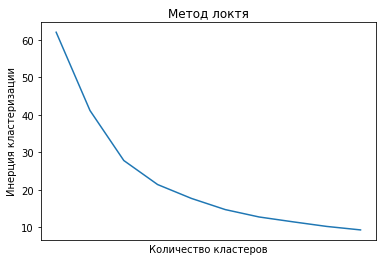

In [799]:
# Метод локтя
n_inertia = []

for i in range(1, 11):
    km = KMeans(n_clusters=i).fit(X)
    n_inertia.append(km.inertia_)
    
fig, ax = plt.subplots()
sns.lineplot(x=np.arange(1, 11), y=n_inertia, ax=ax)
ax.set_title('Метод локтя')
ax.set_xlabel('Количество кластеров')
ax.set_ylabel('Инерция кластеризации')
plt.xticks(np.arange(1, 1))
plt.show()
# ax.set_title('Метод локтя')
# ax.set_xlabel('Количество кластеров')
# ax.set_ylabel('Качество кластеризации')

In [800]:
# Вывод сведений о названиях столбцов датасета df, метод columns
df.columns

Index(['МатрНап', 'Плотн', 'МодУпр', 'КолвОтвер', 'КолвЭпокс', 'ТемпВсп',
       'ПовПлотн', 'МодУпрРаст', 'ПрочнРаст', 'КолвСмол', 'УголНаш', 'ШагНаш',
       'ПлотнНаш', 'ДелРаст', 'Дел'],
      dtype='object')

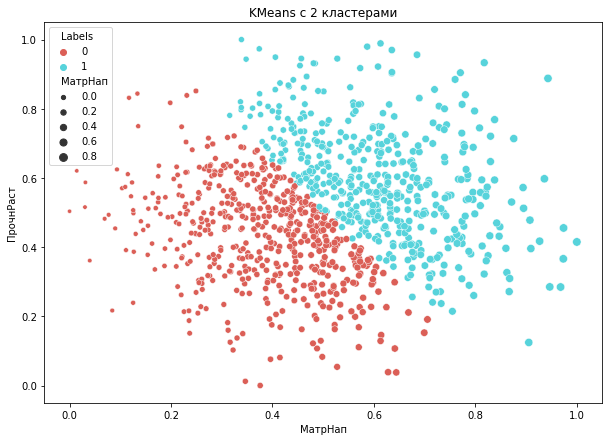

In [801]:
# KMeans показывает кластеризацию параметров
fig = plt.figure(figsize=(10,7))
km5 = KMeans(n_clusters=2).fit(X)
X['Labels'] = km5.labels_

sns.scatterplot(x=X['МатрНап'], y=X['ПрочнРаст'], hue=X['Labels'], size=X['МатрНап'], palette=sns.color_palette('hls', 2))

plt.title('KMeans c 2 кластерами')
plt.show()

In [802]:
# количество данных в кластерах
X[X['Labels']==0].count(),X[X['Labels']==1].count(),X[X['Labels']==2].count(),X[X['Labels']==3].count(),X[X['Labels']==4].count()

(МатрНап      537
 ПрочнРаст    537
 Labels       537
 dtype: int64,
 МатрНап      486
 ПрочнРаст    486
 Labels       486
 dtype: int64,
 МатрНап      0
 ПрочнРаст    0
 Labels       0
 dtype: int64,
 МатрНап      0
 ПрочнРаст    0
 Labels       0
 dtype: int64,
 МатрНап      0
 ПрочнРаст    0
 Labels       0
 dtype: int64)

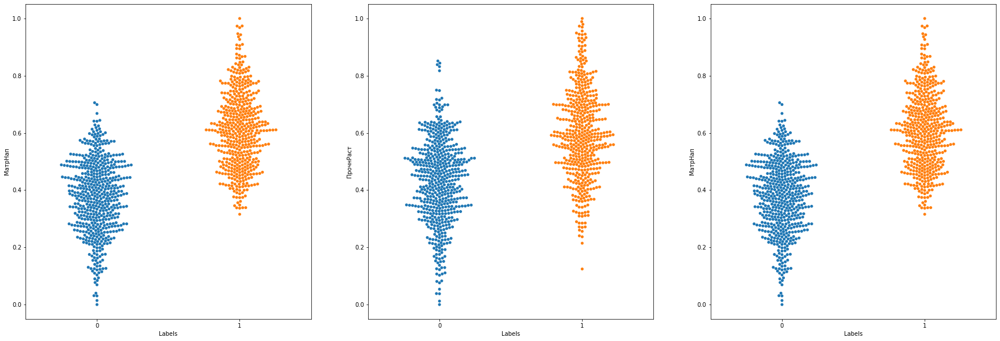

In [803]:
# swarmplot показывает распределение и разброс параметров по кластерам
fig = plt.figure(figsize=(30,10))
ax = fig.add_subplot(131)
sns.swarmplot(x='Labels', y='МатрНап', data=X, ax=ax)

ax = fig.add_subplot(132)
sns.swarmplot(x='Labels', y='ПрочнРаст', data=X, ax=ax)

ax = fig.add_subplot(133)
sns.swarmplot(x='Labels', y='МатрНап', data=X, ax=ax)

plt.show()

In [804]:
# The Silhouette Coefficient is calculated using the mean intra-cluster distance and the mean nearest-cluster distance for each sample
print("Silhouette score: {}".format(silhouette_score(X.drop(['Labels'], axis=1), X.Labels)))

Silhouette score: 0.3145045683004198


###### Иерархическая кластеризация (агломеративная)

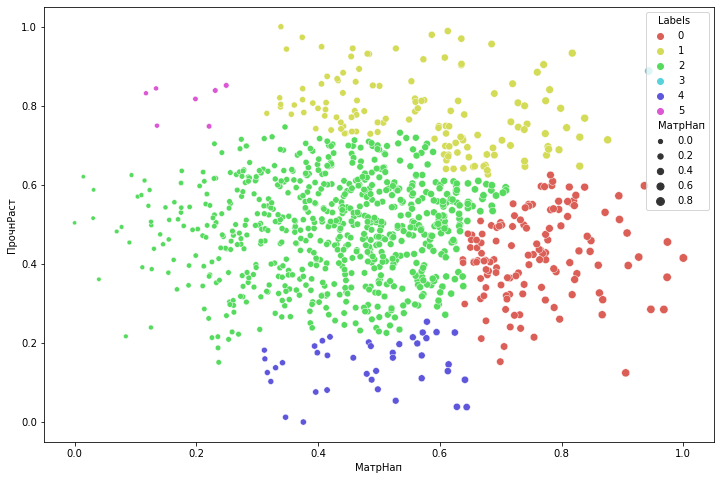

In [805]:
# AgglomerativeClustering показывает агломеративную кластеризацию
agglom = AgglomerativeClustering(n_clusters=6, linkage='average').fit(X.drop(['Labels'], axis=1)) # ward, complete...

X['Labels'] = agglom.labels_
plt.figure(figsize=(12, 8))
sns.scatterplot(x=X['МатрНап'], y=X['ПрочнРаст'], hue=X['Labels'], size=X['МатрНап'],
                palette=sns.color_palette('hls', 6))
plt.show()

In [806]:
# количество данных в кластерах
X[X['Labels']==0].count(),X[X['Labels']==1].count(),X[X['Labels']==2].count(),X[X['Labels']==3].count(),X[X['Labels']==4].count()

(МатрНап      131
 ПрочнРаст    131
 Labels       131
 dtype: int64,
 МатрНап      133
 ПрочнРаст    133
 Labels       133
 dtype: int64,
 МатрНап      711
 ПрочнРаст    711
 Labels       711
 dtype: int64,
 МатрНап      1
 ПрочнРаст    1
 Labels       1
 dtype: int64,
 МатрНап      40
 ПрочнРаст    40
 Labels       40
 dtype: int64)

In [807]:
# The Silhouette Coefficient is calculated using the mean intra-cluster distance and the mean nearest-cluster distance for each sample
print("Silhouette score: {}".format(silhouette_score(X.drop(['Labels'], axis=1), X.Labels)))

Silhouette score: 0.16832544826855833


In [808]:
# The matrix nearest-cluster distance
dist = distance_matrix(X.drop(['Labels'], axis=1), X.drop(['Labels'], axis=1))
print(dist)

[[0.         0.         0.         ... 0.29873471 0.48499668 0.37846558]
 [0.         0.         0.         ... 0.29873471 0.48499668 0.37846558]
 [0.         0.         0.         ... 0.29873471 0.48499668 0.37846558]
 ...
 [0.29873471 0.29873471 0.29873471 ... 0.         0.22556445 0.12251842]
 [0.48499668 0.48499668 0.48499668 ... 0.22556445 0.         0.27976176]
 [0.37846558 0.37846558 0.37846558 ... 0.12251842 0.27976176 0.        ]]


In [809]:
hierarchy_clustering = hierarchy.linkage(dist, 'complete')

C:\Users\Admin\AppData\Local\Temp\ipykernel_7164\1577177698.py:1: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  hierarchy_clustering = hierarchy.linkage(dist, 'complete')


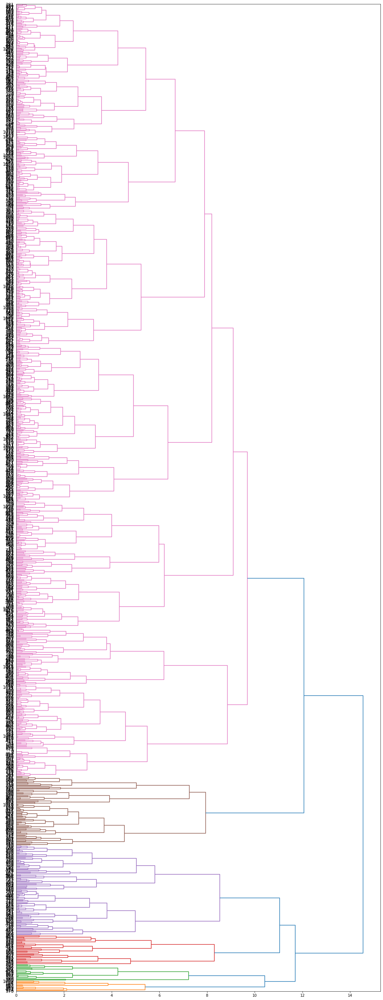

In [810]:
# dendrogram
plt.figure(figsize=(18, 50))
dendro = hierarchy.dendrogram(hierarchy_clustering, leaf_font_size=12, orientation='right')

###### 3. Исключить из параметров 'МатрНап', 'МодУпр', 'КолвОтвер', 'КолвЭпокс', 'ТемпВсп', 'ПовПлотн', 'МодУпрРаст', 'КолвСмол', 'УголНаш', 'ШагНаш', 'ПлотнНаш', 'ДелРаст', 'Дел'

In [811]:
# Вывод сведений о названиях столбцов датасета df, метод columns
df.columns

Index(['МатрНап', 'Плотн', 'МодУпр', 'КолвОтвер', 'КолвЭпокс', 'ТемпВсп',
       'ПовПлотн', 'МодУпрРаст', 'ПрочнРаст', 'КолвСмол', 'УголНаш', 'ШагНаш',
       'ПлотнНаш', 'ДелРаст', 'Дел'],
      dtype='object')

In [812]:
# Назначение переменной X
X = df.drop(['МатрНап', 'МодУпр', 'КолвОтвер', 'КолвЭпокс', 'ТемпВсп', 'ПовПлотн', 'МодУпрРаст', 'КолвСмол', 'УголНаш', 'ШагНаш', 'ПлотнНаш', 'ДелРаст', 'Дел'], axis=1)

###### K-Means

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=4.
  warnings.warn(


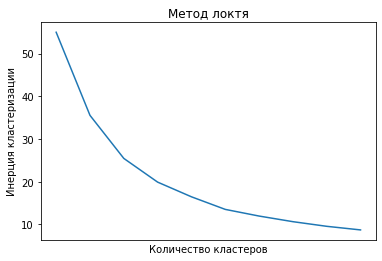

In [813]:
# Метод локтя
n_inertia = []

for i in range(1, 11):
    km = KMeans(n_clusters=i).fit(X)
    n_inertia.append(km.inertia_)
    
fig, ax = plt.subplots()
sns.lineplot(x=np.arange(1, 11), y=n_inertia, ax=ax)
ax.set_title('Метод локтя')
ax.set_xlabel('Количество кластеров')
ax.set_ylabel('Инерция кластеризации')
plt.xticks(np.arange(1, 1))
plt.show()
# ax.set_title('Метод локтя')
# ax.set_xlabel('Количество кластеров')
# ax.set_ylabel('Качество кластеризации')

In [814]:
# Вывод сведений о названиях столбцов датасета df, метод columns
df.columns

Index(['МатрНап', 'Плотн', 'МодУпр', 'КолвОтвер', 'КолвЭпокс', 'ТемпВсп',
       'ПовПлотн', 'МодУпрРаст', 'ПрочнРаст', 'КолвСмол', 'УголНаш', 'ШагНаш',
       'ПлотнНаш', 'ДелРаст', 'Дел'],
      dtype='object')

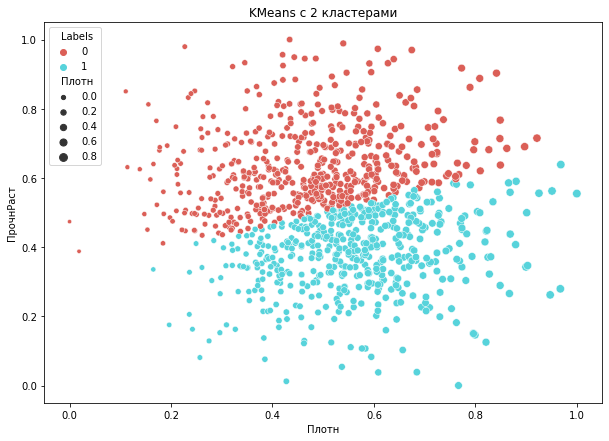

In [815]:
# KMeans показывает кластеризацию параметров
fig = plt.figure(figsize=(10,7))
km5 = KMeans(n_clusters=2).fit(X)
X['Labels'] = km5.labels_

sns.scatterplot(x=X['Плотн'], y=X['ПрочнРаст'], hue=X['Labels'], size=X['Плотн'], palette=sns.color_palette('hls', 2))

plt.title('KMeans c 2 кластерами')
plt.show()

In [816]:
# количество данных в кластерах
X[X['Labels']==0].count(),X[X['Labels']==1].count(),X[X['Labels']==2].count(),X[X['Labels']==3].count(),X[X['Labels']==4].count()

(Плотн        521
 ПрочнРаст    521
 Labels       521
 dtype: int64,
 Плотн        502
 ПрочнРаст    502
 Labels       502
 dtype: int64,
 Плотн        0
 ПрочнРаст    0
 Labels       0
 dtype: int64,
 Плотн        0
 ПрочнРаст    0
 Labels       0
 dtype: int64,
 Плотн        0
 ПрочнРаст    0
 Labels       0
 dtype: int64)

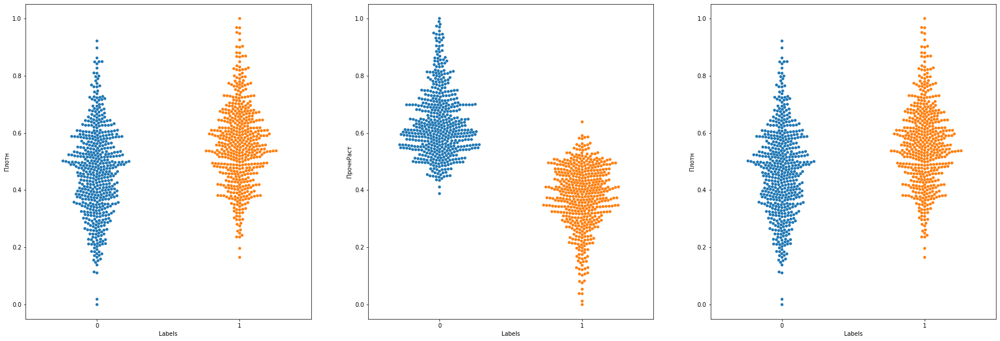

In [817]:
# swarmplot показывает распределение и разброс параметров по кластерам
fig = plt.figure(figsize=(30,10))
ax = fig.add_subplot(131)
sns.swarmplot(x='Labels', y='Плотн', data=X, ax=ax)

ax = fig.add_subplot(132)
sns.swarmplot(x='Labels', y='ПрочнРаст', data=X, ax=ax)

ax = fig.add_subplot(133)
sns.swarmplot(x='Labels', y='Плотн', data=X, ax=ax)

plt.show()

In [818]:
# The Silhouette Coefficient is calculated using the mean intra-cluster distance and the mean nearest-cluster distance for each sample
print("Silhouette score: {}".format(silhouette_score(X.drop(['Labels'], axis=1), X.Labels)))

Silhouette score: 0.3211316139222192


###### Иерархическая кластеризация (агломеративная)

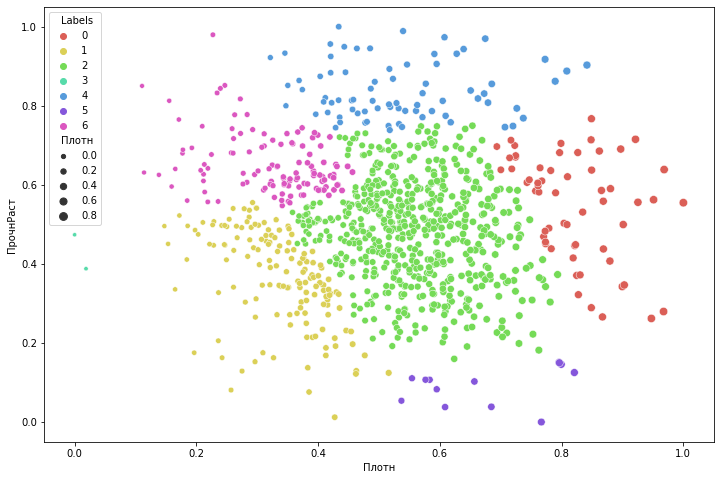

In [819]:
# AgglomerativeClustering показывает агломеративную кластеризацию
agglom = AgglomerativeClustering(n_clusters=7, linkage='average').fit(X.drop(['Labels'], axis=1)) # ward, complete...

X['Labels'] = agglom.labels_
plt.figure(figsize=(12, 8))
sns.scatterplot(x=X['Плотн'], y=X['ПрочнРаст'], hue=X['Labels'], size=X['Плотн'],
                palette=sns.color_palette('hls', 7))
plt.show()

In [820]:
# количество данных в кластерах
X[X['Labels']==0].count(),X[X['Labels']==1].count(),X[X['Labels']==2].count(),X[X['Labels']==3].count(),X[X['Labels']==4].count()

(Плотн        59
 ПрочнРаст    59
 Labels       59
 dtype: int64,
 Плотн        150
 ПрочнРаст    150
 Labels       150
 dtype: int64,
 Плотн        606
 ПрочнРаст    606
 Labels       606
 dtype: int64,
 Плотн        2
 ПрочнРаст    2
 Labels       2
 dtype: int64,
 Плотн        76
 ПрочнРаст    76
 Labels       76
 dtype: int64)

In [821]:
# The Silhouette Coefficient is calculated using the mean intra-cluster distance and the mean nearest-cluster distance for each sample
print("Silhouette score: {}".format(silhouette_score(X.drop(['Labels'], axis=1), X.Labels)))

Silhouette score: 0.21396831294929003


In [822]:
# The matrix nearest-cluster distance
dist = distance_matrix(X.drop(['Labels'], axis=1), X.drop(['Labels'], axis=1))
print(dist)

[[0.         0.         0.         ... 0.17038504 0.33909486 0.29766252]
 [0.         0.         0.         ... 0.17038504 0.33909486 0.29766252]
 [0.         0.         0.         ... 0.17038504 0.33909486 0.29766252]
 ...
 [0.17038504 0.17038504 0.17038504 ... 0.         0.2890759  0.18541536]
 [0.33909486 0.33909486 0.33909486 ... 0.2890759  0.         0.46388186]
 [0.29766252 0.29766252 0.29766252 ... 0.18541536 0.46388186 0.        ]]


In [823]:
hierarchy_clustering = hierarchy.linkage(dist, 'complete')

C:\Users\Admin\AppData\Local\Temp\ipykernel_7164\1577177698.py:1: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  hierarchy_clustering = hierarchy.linkage(dist, 'complete')


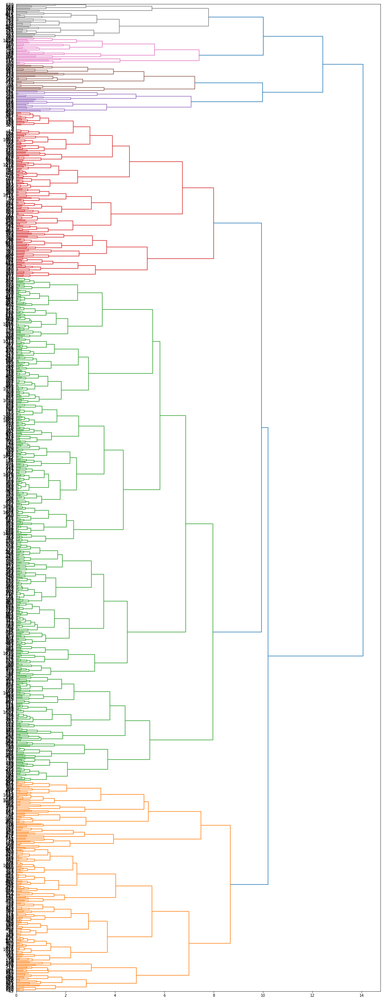

In [824]:
# dendrogram
plt.figure(figsize=(18, 50))
dendro = hierarchy.dendrogram(hierarchy_clustering, leaf_font_size=12, orientation='right')

###### 4. Исключить из параметров 'МатрНап', 'Плотн', 'КолвОтвер', 'КолвЭпокс', 'ТемпВсп', 'ПовПлотн', 'МодУпрРаст', 'КолвСмол', 'УголНаш', 'ШагНаш', 'ПлотнНаш', 'ДелРаст', 'Дел'

In [825]:
# Вывод сведений о названиях столбцов датасета df, метод columns
df.columns

Index(['МатрНап', 'Плотн', 'МодУпр', 'КолвОтвер', 'КолвЭпокс', 'ТемпВсп',
       'ПовПлотн', 'МодУпрРаст', 'ПрочнРаст', 'КолвСмол', 'УголНаш', 'ШагНаш',
       'ПлотнНаш', 'ДелРаст', 'Дел'],
      dtype='object')

In [826]:
# Назначение переменной X
X = df.drop(['МатрНап', 'Плотн', 'КолвОтвер', 'КолвЭпокс', 'ТемпВсп', 'ПовПлотн', 'МодУпрРаст', 'КолвСмол', 'УголНаш', 'ШагНаш', 'ПлотнНаш', 'ДелРаст', 'Дел'], axis=1)

###### K-Means

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=4.
  warnings.warn(


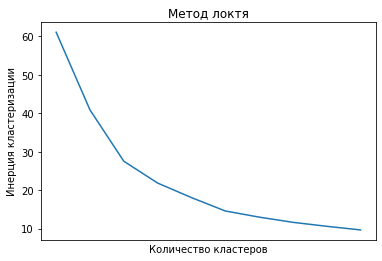

In [827]:
# Метод локтя
n_inertia = []

for i in range(1, 11):
    km = KMeans(n_clusters=i).fit(X)
    n_inertia.append(km.inertia_)
    
fig, ax = plt.subplots()
sns.lineplot(x=np.arange(1, 11), y=n_inertia, ax=ax)
ax.set_title('Метод локтя')
ax.set_xlabel('Количество кластеров')
ax.set_ylabel('Инерция кластеризации')
plt.xticks(np.arange(1, 1))
plt.show()
# ax.set_title('Метод локтя')
# ax.set_xlabel('Количество кластеров')
# ax.set_ylabel('Качество кластеризации')

In [828]:
# Вывод сведений о названиях столбцов датасета df, метод columns
df.columns

Index(['МатрНап', 'Плотн', 'МодУпр', 'КолвОтвер', 'КолвЭпокс', 'ТемпВсп',
       'ПовПлотн', 'МодУпрРаст', 'ПрочнРаст', 'КолвСмол', 'УголНаш', 'ШагНаш',
       'ПлотнНаш', 'ДелРаст', 'Дел'],
      dtype='object')

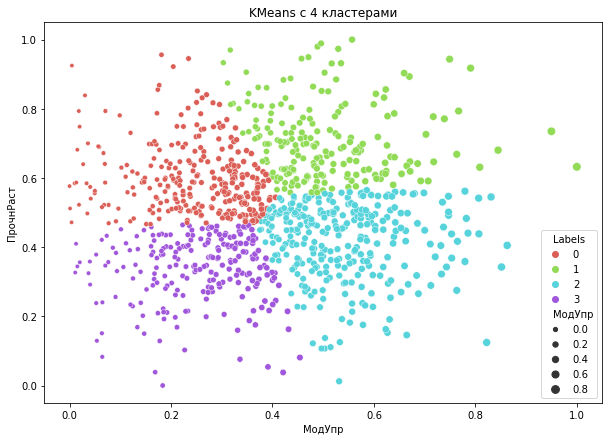

In [829]:
# KMeans показывает кластеризацию параметров
fig = plt.figure(figsize=(10,7))
km5 = KMeans(n_clusters=4).fit(X)
X['Labels'] = km5.labels_

sns.scatterplot(x=X['МодУпр'], y=X['ПрочнРаст'], hue=X['Labels'], size=X['МодУпр'], palette=sns.color_palette('hls', 4))

plt.title('KMeans c 4 кластерами')
plt.show()

In [830]:
# количество данных в кластерах
X[X['Labels']==0].count(),X[X['Labels']==1].count(),X[X['Labels']==2].count(),X[X['Labels']==3].count(),X[X['Labels']==4].count()

(МодУпр       282
 ПрочнРаст    282
 Labels       282
 dtype: int64,
 МодУпр       211
 ПрочнРаст    211
 Labels       211
 dtype: int64,
 МодУпр       306
 ПрочнРаст    306
 Labels       306
 dtype: int64,
 МодУпр       224
 ПрочнРаст    224
 Labels       224
 dtype: int64,
 МодУпр       0
 ПрочнРаст    0
 Labels       0
 dtype: int64)

In [831]:
# данные в кластерах по параметру 'ПрочнРаст'
X[X['Labels']==0]['ПрочнРаст'].head(20),X[X['Labels']==1]['ПрочнРаст'].head(20),X[X['Labels']==2]['ПрочнРаст'].head(20)

(13    0.504591
 15    0.698235
 16    0.698235
 21    0.504591
 22    0.504591
 25    0.564512
 27    0.719231
 29    0.593114
 32    0.507099
 40    0.644347
 52    0.497733
 55    0.585983
 57    0.753826
 58    0.598115
 61    0.522293
 64    0.699905
 67    0.683267
 71    0.639752
 75    0.627875
 91    0.546588
 Name: ПрочнРаст, dtype: float64,
 0     0.698235
 1     0.698235
 2     0.698235
 3     0.698235
 4     0.698235
 5     0.698235
 6     0.698235
 24    0.949223
 31    0.625957
 34    0.729017
 35    0.765150
 38    0.605842
 41    0.651495
 46    0.843247
 56    0.594412
 62    0.648537
 68    0.832440
 73    0.745932
 76    0.611853
 81    0.641660
 Name: ПрочнРаст, dtype: float64,
 8     0.271429
 9     0.342563
 10    0.342563
 11    0.342563
 12    0.504591
 14    0.504591
 19    0.342563
 23    0.551464
 26    0.510862
 30    0.502239
 33    0.450606
 37    0.124386
 39    0.541612
 43    0.461906
 47    0.529936
 48    0.506003
 49    0.269906
 53    0.542289
 59 

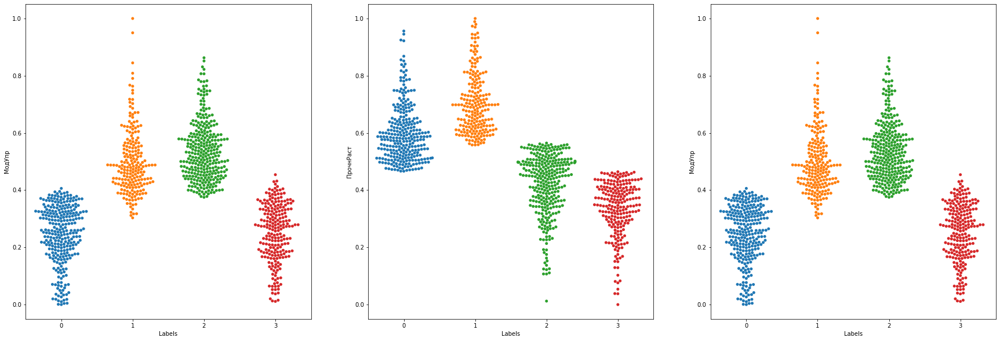

In [832]:
# swarmplot показывает распределение и разброс параметров по кластерам
fig = plt.figure(figsize=(30,10))
ax = fig.add_subplot(131)
sns.swarmplot(x='Labels', y='МодУпр', data=X, ax=ax)

ax = fig.add_subplot(132)
sns.swarmplot(x='Labels', y='ПрочнРаст', data=X, ax=ax)

ax = fig.add_subplot(133)
sns.swarmplot(x='Labels', y='МодУпр', data=X, ax=ax)

plt.show()

In [833]:
# The Silhouette Coefficient is calculated using the mean intra-cluster distance and the mean nearest-cluster distance for each sample
print("Silhouette score: {}".format(silhouette_score(X.drop(['Labels'], axis=1), X.Labels)))

Silhouette score: 0.31920552724510964


###### Иерархическая кластеризация (агломеративная)

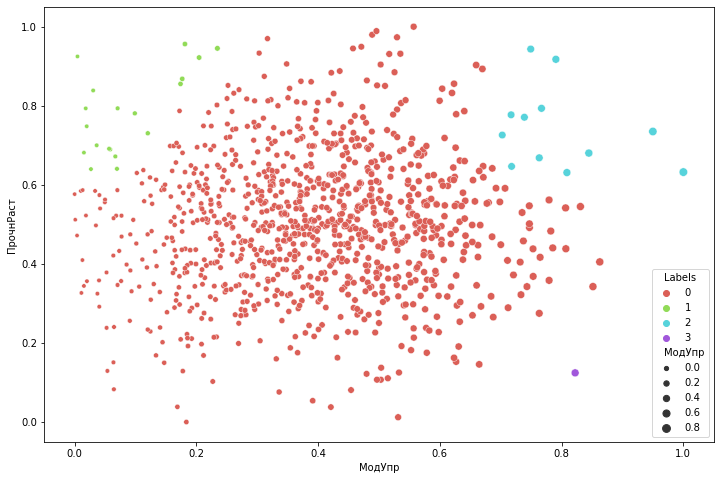

In [834]:
# AgglomerativeClustering показывает агломеративную кластеризацию
agglom = AgglomerativeClustering(n_clusters=4, linkage='average').fit(X.drop(['Labels'], axis=1)) # ward, complete...

X['Labels'] = agglom.labels_
plt.figure(figsize=(12, 8))
sns.scatterplot(x=X['МодУпр'], y=X['ПрочнРаст'], hue=X['Labels'], size=X['МодУпр'],
                palette=sns.color_palette('hls', 4))
plt.show()

In [835]:
# количество данных в кластерах
X[X['Labels']==0].count(),X[X['Labels']==1].count(),X[X['Labels']==2].count(),X[X['Labels']==3].count(),X[X['Labels']==4].count()

(МодУпр       991
 ПрочнРаст    991
 Labels       991
 dtype: int64,
 МодУпр       19
 ПрочнРаст    19
 Labels       19
 dtype: int64,
 МодУпр       12
 ПрочнРаст    12
 Labels       12
 dtype: int64,
 МодУпр       1
 ПрочнРаст    1
 Labels       1
 dtype: int64,
 МодУпр       0
 ПрочнРаст    0
 Labels       0
 dtype: int64)

In [836]:
# данные в кластерах по 'ПрочнРаст'
X[X['Labels']==0]['ПрочнРаст'],X[X['Labels']==1]['ПрочнРаст'],X[X['Labels']==2]['ПрочнРаст'],X[X['Labels']==3]['ПрочнРаст'],X[X['Labels']==4]['ПрочнРаст'],X[X['Labels']==5]['ПрочнРаст']

(0       0.698235
 1       0.698235
 2       0.698235
 3       0.698235
 4       0.698235
           ...   
 1018    0.480312
 1019    0.470745
 1020    0.578340
 1021    0.368070
 1022    0.647135
 Name: ПрочнРаст, Length: 991, dtype: float64,
 71     0.639752
 99     0.956165
 209    0.780800
 249    0.793544
 286    0.700024
 332    0.748135
 335    0.921909
 395    0.855358
 523    0.924760
 611    0.681461
 613    0.730434
 654    0.945177
 655    0.689572
 768    0.640532
 927    0.671844
 957    0.691339
 958    0.868113
 985    0.838621
 993    0.793434
 Name: ПрочнРаст, dtype: float64,
 95      0.725931
 232     0.631015
 424     0.793493
 512     0.777175
 549     0.680353
 586     0.917481
 592     0.632194
 638     0.646632
 653     0.770908
 667     0.668333
 770     0.734869
 1008    0.943372
 Name: ПрочнРаст, dtype: float64,
 37    0.124386
 Name: ПрочнРаст, dtype: float64,
 Series([], Name: ПрочнРаст, dtype: float64),
 Series([], Name: ПрочнРаст, dtype: float64))

In [837]:
# The Silhouette Coefficient is calculated using the mean intra-cluster distance and the mean nearest-cluster distance for each sample
print("Silhouette score: {}".format(silhouette_score(X.drop(['Labels'], axis=1), X.Labels)))

Silhouette score: 0.17165381123366089


In [838]:
# The matrix nearest-cluster distance
dist = distance_matrix(X.drop(['Labels'], axis=1), X.drop(['Labels'], axis=1))
print(dist)

[[0.         0.         0.         ... 0.20689454 0.33016769 0.17594626]
 [0.         0.         0.         ... 0.20689454 0.33016769 0.17594626]
 [0.         0.         0.         ... 0.20689454 0.33016769 0.17594626]
 ...
 [0.20689454 0.20689454 0.20689454 ... 0.         0.27042514 0.06879554]
 [0.33016769 0.33016769 0.33016769 ... 0.27042514 0.         0.32666217]
 [0.17594626 0.17594626 0.17594626 ... 0.06879554 0.32666217 0.        ]]


In [839]:
hierarchy_clustering = hierarchy.linkage(dist, 'complete')

C:\Users\Admin\AppData\Local\Temp\ipykernel_7164\1577177698.py:1: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  hierarchy_clustering = hierarchy.linkage(dist, 'complete')


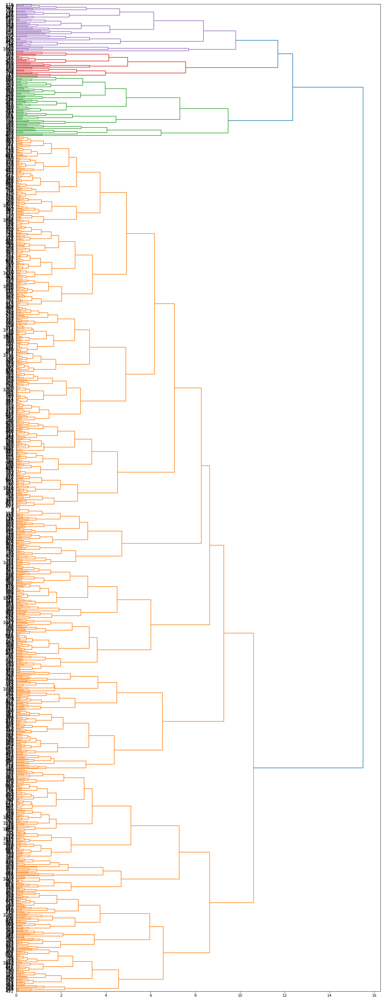

In [840]:
# dendrogram
plt.figure(figsize=(18, 50))
dendro = hierarchy.dendrogram(hierarchy_clustering, leaf_font_size=12, orientation='right')

### DBSCAN

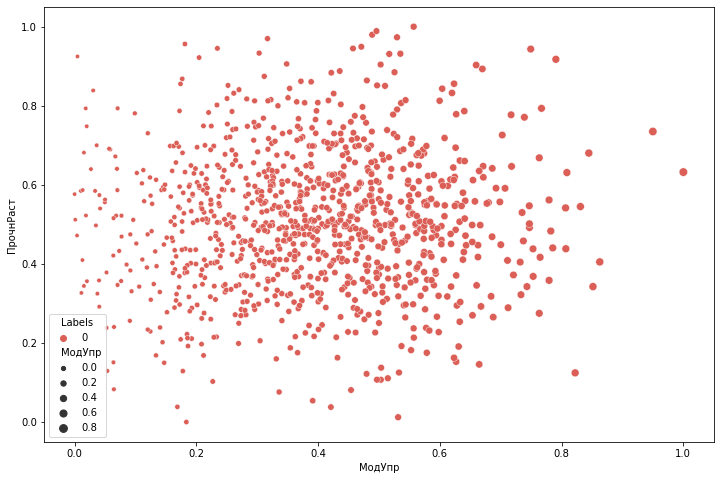

In [841]:
# кластеризация DBSCAN
from sklearn.cluster import DBSCAN 

db = DBSCAN(eps=10, min_samples=2).fit(X.drop(['Labels'], axis=1))

X['Labels'] = db.labels_
plt.figure(figsize=(12, 8))
sns.scatterplot(x=X['МодУпр'], y=X['ПрочнРаст'], hue=X['Labels'], size=X['МодУпр'],
                palette=sns.color_palette('hls', np.unique(db.labels_).shape[0]))
plt.show()

In [842]:
# The Silhouette Coefficient is calculated using the mean intra-cluster distance and the mean nearest-cluster distance for each sample
# print("Silhouette score: {}".format(silhouette_score(X.drop(['Labels'], axis=1), X.Labels)))

### C-means

In [843]:
# C-mean подобно KMeans показывает кластеризацию параметров
X.drop(['Labels'], axis=1, inplace=True)
fcm = FCM(n_clusters=4)
fcm.fit(X.values)

fcm_centers = fcm.centers
fcm_labels = fcm.predict(X.values) 

In [844]:
X['Labels'] = fcm_labels

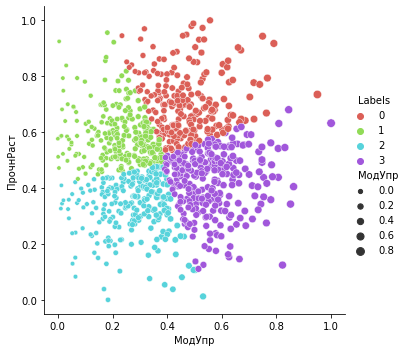

In [845]:
sns.relplot(x='МодУпр', y='ПрочнРаст', hue='Labels', 
            size='МодУпр', data=X, palette = sns.color_palette('hls', 4))

In [846]:
# количество данных в кластерах
X[X['Labels']==0].count(),X[X['Labels']==1].count(),X[X['Labels']==2].count(),X[X['Labels']==3].count()

(МодУпр       241
 ПрочнРаст    241
 Labels       241
 dtype: int64,
 МодУпр       249
 ПрочнРаст    249
 Labels       249
 dtype: int64,
 МодУпр       243
 ПрочнРаст    243
 Labels       243
 dtype: int64,
 МодУпр       290
 ПрочнРаст    290
 Labels       290
 dtype: int64)

In [847]:
# данные в кластерах по 'ПрочнРаст'
X[X['Labels']==0]['ПрочнРаст'],X[X['Labels']==1]['ПрочнРаст'],X[X['Labels']==2]['ПрочнРаст'],X[X['Labels']==3]['ПрочнРаст']

(0       0.698235
 1       0.698235
 2       0.698235
 3       0.698235
 4       0.698235
           ...   
 1000    0.597207
 1001    0.598886
 1004    0.616017
 1008    0.943372
 1017    0.734705
 Name: ПрочнРаст, Length: 241, dtype: float64,
 13      0.504591
 15      0.698235
 16      0.698235
 21      0.504591
 22      0.504591
           ...   
 1011    0.695045
 1016    0.508635
 1019    0.470745
 1020    0.578340
 1022    0.647135
 Name: ПрочнРаст, Length: 249, dtype: float64,
 7       0.271429
 17      0.271429
 18      0.271429
 20      0.342563
 28      0.445341
           ...   
 1002    0.330709
 1003    0.371232
 1006    0.457243
 1013    0.320976
 1021    0.368070
 Name: ПрочнРаст, Length: 243, dtype: float64,
 8       0.271429
 9       0.342563
 10      0.342563
 11      0.342563
 12      0.504591
           ...   
 1010    0.317909
 1012    0.378053
 1014    0.526985
 1015    0.500297
 1018    0.480312
 Name: ПрочнРаст, Length: 290, dtype: float64)

In [848]:
# The Silhouette Coefficient is calculated using the mean intra-cluster distance and the mean nearest-cluster distance for each sample
print("Silhouette score: {}".format(silhouette_score(X.drop(['Labels'], axis=1), X.Labels)))

Silhouette score: 0.311865162314079


Проверка значимости различия групп по критерию Краскала-Уоллиса

In [849]:
# индексация кластеров
filter_0 = X[X['Labels']==0].index
filter_1 = X[X['Labels']==1].index
filter_2 = X[X['Labels']==2].index
filter_3 = X[X['Labels']==3].index

In [850]:
# выделение объектов np.array
df_0 = np.array(df_s['ПрочнРаст'][filter_0].reset_index(drop=True))
df_1 = np.array(df_s['ПрочнРаст'][filter_1].reset_index(drop=True))
df_2 = np.array(df_s['ПрочнРаст'][filter_2].reset_index(drop=True))
df_3 = np.array(df_s['ПрочнРаст'][filter_3].reset_index(drop=True))

In [851]:
# критерий Краскала-Уоллиса
stats.mstats.kruskalwallis(df_0,df_1,df_2,df_3)

KruskalResult(statistic=748.8469607231197, pvalue=5.366164413836229e-162)

Вывод: различия по группам статистически значимы для параметра 'МодУпр'

###### 5. Исключить из параметров 'МатрНап', 'Плотн', 'МодУпр', 'КолвЭпокс', 'ТемпВсп', 'ПовПлотн', 'МодУпрРаст', 'КолвСмол', 'УголНаш', 'ШагНаш', 'ПлотнНаш', 'ДелРаст', 'Дел'

In [852]:
# Вывод сведений о названиях столбцов датасета df, метод columns
df.columns

Index(['МатрНап', 'Плотн', 'МодУпр', 'КолвОтвер', 'КолвЭпокс', 'ТемпВсп',
       'ПовПлотн', 'МодУпрРаст', 'ПрочнРаст', 'КолвСмол', 'УголНаш', 'ШагНаш',
       'ПлотнНаш', 'ДелРаст', 'Дел'],
      dtype='object')

In [853]:
# Назначение переменной X
X = df.drop(['МатрНап', 'Плотн', 'МодУпр', 'КолвЭпокс', 'ТемпВсп', 'ПовПлотн', 'МодУпрРаст', 'КолвСмол', 'УголНаш', 'ШагНаш', 'ПлотнНаш', 'ДелРаст', 'Дел'], axis=1)

###### K-Means

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=4.
  warnings.warn(


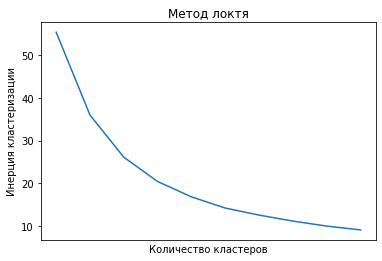

In [854]:
# Метод локтя
n_inertia = []

for i in range(1, 11):
    km = KMeans(n_clusters=i).fit(X)
    n_inertia.append(km.inertia_)
    
fig, ax = plt.subplots()
sns.lineplot(x=np.arange(1, 11), y=n_inertia, ax=ax)
ax.set_title('Метод локтя')
ax.set_xlabel('Количество кластеров')
ax.set_ylabel('Инерция кластеризации')
plt.xticks(np.arange(1, 1))
plt.show()
# ax.set_title('Метод локтя')
# ax.set_xlabel('Количество кластеров')
# ax.set_ylabel('Качество кластеризации')

In [855]:
# Вывод сведений о названиях столбцов датасета df, метод columns
df.columns

Index(['МатрНап', 'Плотн', 'МодУпр', 'КолвОтвер', 'КолвЭпокс', 'ТемпВсп',
       'ПовПлотн', 'МодУпрРаст', 'ПрочнРаст', 'КолвСмол', 'УголНаш', 'ШагНаш',
       'ПлотнНаш', 'ДелРаст', 'Дел'],
      dtype='object')

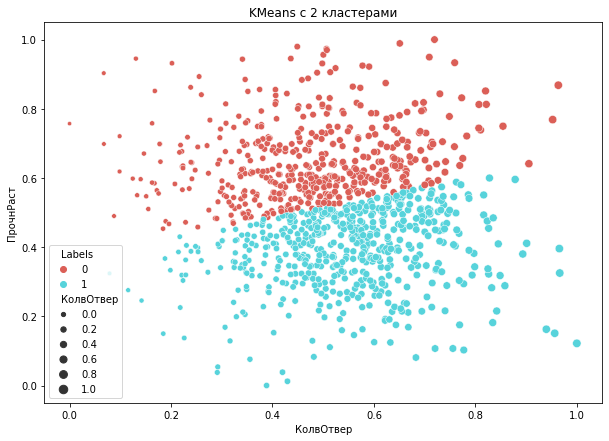

In [856]:
# KMeans показывает кластеризацию параметров
fig = plt.figure(figsize=(10,7))
km5 = KMeans(n_clusters=2).fit(X)
X['Labels'] = km5.labels_

sns.scatterplot(x=X['КолвОтвер'], y=X['ПрочнРаст'], hue=X['Labels'], size=X['КолвОтвер'], palette=sns.color_palette('hls', 2))

plt.title('KMeans c 2 кластерами')
plt.show()

In [857]:
# количество данных в кластерах
X[X['Labels']==0].count(),X[X['Labels']==1].count(),X[X['Labels']==2].count(),X[X['Labels']==3].count(),X[X['Labels']==4].count()

(КолвОтвер    469
 ПрочнРаст    469
 Labels       469
 dtype: int64,
 КолвОтвер    554
 ПрочнРаст    554
 Labels       554
 dtype: int64,
 КолвОтвер    0
 ПрочнРаст    0
 Labels       0
 dtype: int64,
 КолвОтвер    0
 ПрочнРаст    0
 Labels       0
 dtype: int64,
 КолвОтвер    0
 ПрочнРаст    0
 Labels       0
 dtype: int64)

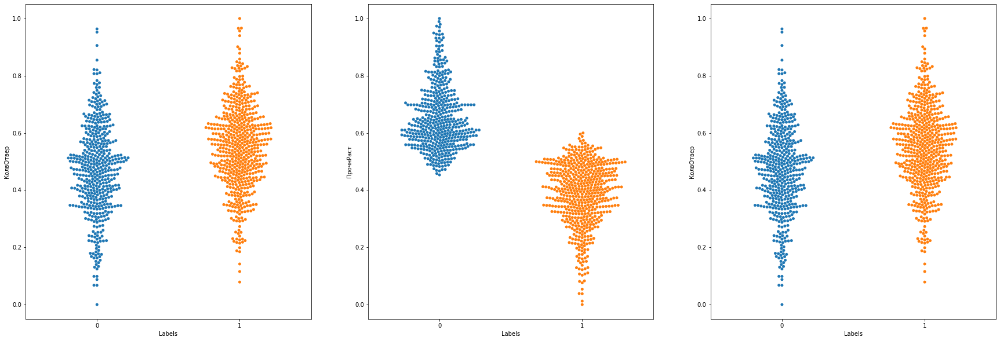

In [858]:
# swarmplot показывает распределение и разброс параметров по кластерам
fig = plt.figure(figsize=(30,10))
ax = fig.add_subplot(131)
sns.swarmplot(x='Labels', y='КолвОтвер', data=X, ax=ax)

ax = fig.add_subplot(132)
sns.swarmplot(x='Labels', y='ПрочнРаст', data=X, ax=ax)

ax = fig.add_subplot(133)
sns.swarmplot(x='Labels', y='КолвОтвер', data=X, ax=ax)

plt.show()

In [859]:
# The Silhouette Coefficient is calculated using the mean intra-cluster distance and the mean nearest-cluster distance for each sample
print("Silhouette score: {}".format(silhouette_score(X.drop(['Labels'], axis=1), X.Labels)))

Silhouette score: 0.32015033498997436


###### Иерархическая кластеризация (агломеративная)

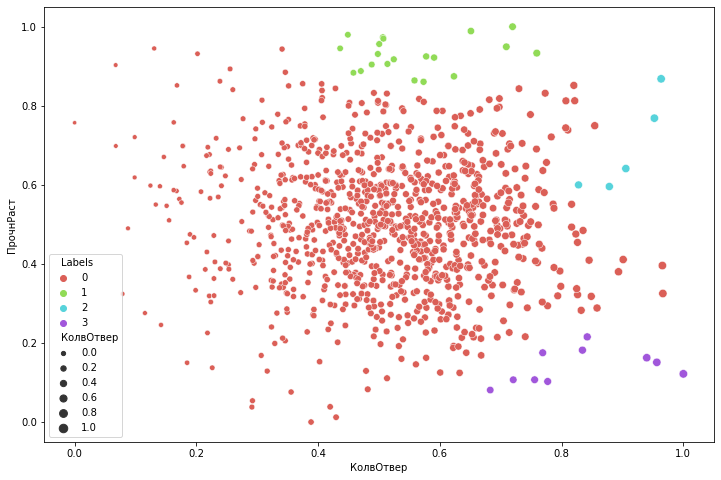

In [860]:
# AgglomerativeClustering показывает агломеративную кластеризацию
agglom = AgglomerativeClustering(n_clusters=4, linkage='average').fit(X.drop(['Labels'], axis=1)) # ward, complete...

X['Labels'] = agglom.labels_
plt.figure(figsize=(12, 8))
sns.scatterplot(x=X['КолвОтвер'], y=X['ПрочнРаст'], hue=X['Labels'], size=X['КолвОтвер'],
                palette=sns.color_palette('hls', 4))
plt.show()

In [861]:
# количество данных в кластерах
X[X['Labels']==0].count(),X[X['Labels']==1].count(),X[X['Labels']==2].count(),X[X['Labels']==3].count(),X[X['Labels']==4].count()

(КолвОтвер    988
 ПрочнРаст    988
 Labels       988
 dtype: int64,
 КолвОтвер    20
 ПрочнРаст    20
 Labels       20
 dtype: int64,
 КолвОтвер    5
 ПрочнРаст    5
 Labels       5
 dtype: int64,
 КолвОтвер    10
 ПрочнРаст    10
 Labels       10
 dtype: int64,
 КолвОтвер    0
 ПрочнРаст    0
 Labels       0
 dtype: int64)

In [862]:
# The Silhouette Coefficient is calculated using the mean intra-cluster distance and the mean nearest-cluster distance for each sample
print("Silhouette score: {}".format(silhouette_score(X.drop(['Labels'], axis=1), X.Labels)))

Silhouette score: 0.21459081487917772


In [863]:
# The matrix nearest-cluster distance
dist = distance_matrix(X.drop(['Labels'], axis=1), X.drop(['Labels'], axis=1))
print(dist)

[[0.00000000e+00 1.10367399e-01 1.09815562e-01 ... 4.60302239e-01
  6.97787913e-01 5.49710989e-01]
 [1.10367399e-01 0.00000000e+00 5.51836994e-04 ... 3.54910672e-01
  6.02822935e-01 4.39941115e-01]
 [1.09815562e-01 5.51836994e-04 0.00000000e+00 ... 3.55430117e-01
  6.03284720e-01 4.40489221e-01]
 ...
 [4.60302239e-01 3.54910672e-01 3.55430117e-01 ... 0.00000000e+00
  2.70597158e-01 1.23793079e-01]
 [6.97787913e-01 6.02822935e-01 6.03284720e-01 ... 2.70597158e-01
  0.00000000e+00 2.87089742e-01]
 [5.49710989e-01 4.39941115e-01 4.40489221e-01 ... 1.23793079e-01
  2.87089742e-01 0.00000000e+00]]


In [864]:
hierarchy_clustering = hierarchy.linkage(dist, 'complete')

C:\Users\Admin\AppData\Local\Temp\ipykernel_7164\1577177698.py:1: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  hierarchy_clustering = hierarchy.linkage(dist, 'complete')


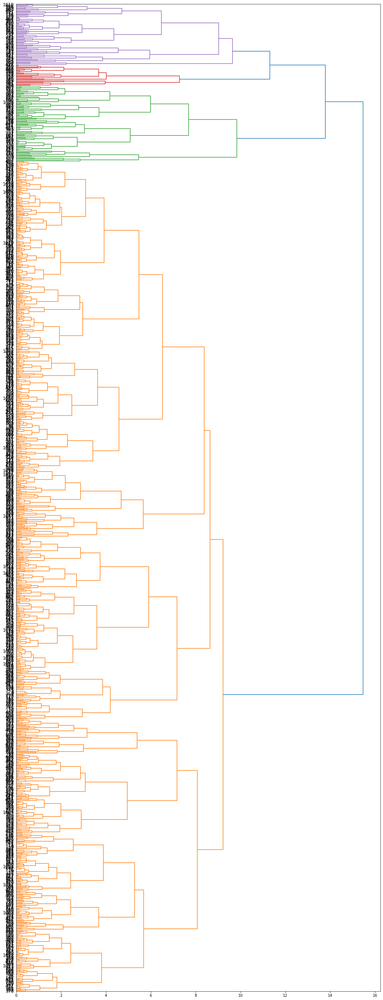

In [865]:
# dendrogram
plt.figure(figsize=(18, 50))
dendro = hierarchy.dendrogram(hierarchy_clustering, leaf_font_size=12, orientation='right')

###### 6. Исключить из параметров 'МатрНап', 'Плотн', 'МодУпр', 'КолвОтвер', 'ТемпВсп', 'ПовПлотн', 'МодУпрРаст', 'КолвСмол', 'УголНаш', 'ШагНаш', 'ПлотнНаш', 'ДелРаст', 'Дел'

In [866]:
# Вывод сведений о названиях столбцов датасета df, метод columns
df.columns

Index(['МатрНап', 'Плотн', 'МодУпр', 'КолвОтвер', 'КолвЭпокс', 'ТемпВсп',
       'ПовПлотн', 'МодУпрРаст', 'ПрочнРаст', 'КолвСмол', 'УголНаш', 'ШагНаш',
       'ПлотнНаш', 'ДелРаст', 'Дел'],
      dtype='object')

In [867]:
# Назначение переменной X
X = df.drop(['МатрНап', 'Плотн', 'МодУпр', 'КолвОтвер', 'ТемпВсп', 'ПовПлотн', 'МодУпрРаст', 'КолвСмол', 'УголНаш', 'ШагНаш', 'ПлотнНаш', 'ДелРаст', 'Дел'], axis=1)

###### K-Means

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=4.
  warnings.warn(


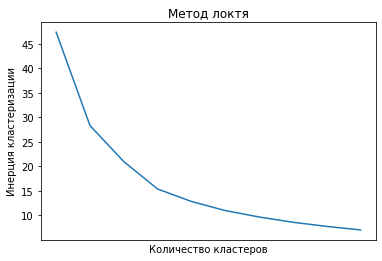

In [868]:
# Метод локтя
n_inertia = []

for i in range(1, 11):
    km = KMeans(n_clusters=i).fit(X)
    n_inertia.append(km.inertia_)
    
fig, ax = plt.subplots()
sns.lineplot(x=np.arange(1, 11), y=n_inertia, ax=ax)
ax.set_title('Метод локтя')
ax.set_xlabel('Количество кластеров')
ax.set_ylabel('Инерция кластеризации')
plt.xticks(np.arange(1, 1))
plt.show()
# ax.set_title('Метод локтя')
# ax.set_xlabel('Количество кластеров')
# ax.set_ylabel('Качество кластеризации')

In [869]:
# Вывод сведений о названиях столбцов датасета df, метод columns
df.columns

Index(['МатрНап', 'Плотн', 'МодУпр', 'КолвОтвер', 'КолвЭпокс', 'ТемпВсп',
       'ПовПлотн', 'МодУпрРаст', 'ПрочнРаст', 'КолвСмол', 'УголНаш', 'ШагНаш',
       'ПлотнНаш', 'ДелРаст', 'Дел'],
      dtype='object')

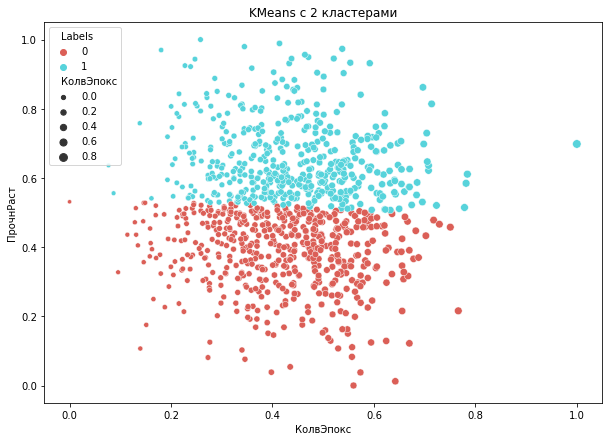

In [870]:
# KMeans показывает кластеризацию параметров
fig = plt.figure(figsize=(10,7))
km5 = KMeans(n_clusters=2).fit(X)
X['Labels'] = km5.labels_

sns.scatterplot(x=X['КолвЭпокс'], y=X['ПрочнРаст'], hue=X['Labels'], size=X['КолвЭпокс'], palette=sns.color_palette('hls', 2))

plt.title('KMeans c 2 кластерами')
plt.show()

In [871]:
# количество данных в кластерах
X[X['Labels']==0].count(),X[X['Labels']==1].count(),X[X['Labels']==2].count(),X[X['Labels']==3].count(),X[X['Labels']==4].count()

(КолвЭпокс    546
 ПрочнРаст    546
 Labels       546
 dtype: int64,
 КолвЭпокс    477
 ПрочнРаст    477
 Labels       477
 dtype: int64,
 КолвЭпокс    0
 ПрочнРаст    0
 Labels       0
 dtype: int64,
 КолвЭпокс    0
 ПрочнРаст    0
 Labels       0
 dtype: int64,
 КолвЭпокс    0
 ПрочнРаст    0
 Labels       0
 dtype: int64)

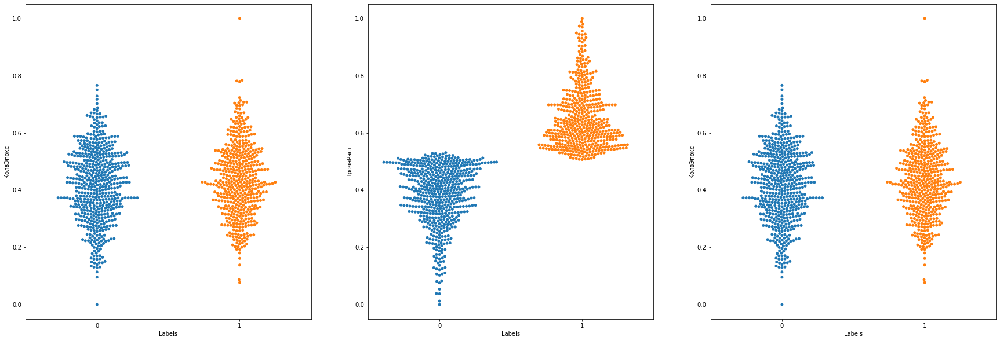

In [872]:
# swarmplot показывает распределение и разброс параметров по кластерам
fig = plt.figure(figsize=(30,10))
ax = fig.add_subplot(131)
sns.swarmplot(x='Labels', y='КолвЭпокс', data=X, ax=ax)

ax = fig.add_subplot(132)
sns.swarmplot(x='Labels', y='ПрочнРаст', data=X, ax=ax)

ax = fig.add_subplot(133)
sns.swarmplot(x='Labels', y='КолвЭпокс', data=X, ax=ax)

plt.show()

In [873]:
# The Silhouette Coefficient is calculated using the mean intra-cluster distance and the mean nearest-cluster distance for each sample
print("Silhouette score: {}".format(silhouette_score(X.drop(['Labels'], axis=1), X.Labels)))

Silhouette score: 0.34991897995729


###### Иерархическая кластеризация (агломеративная)

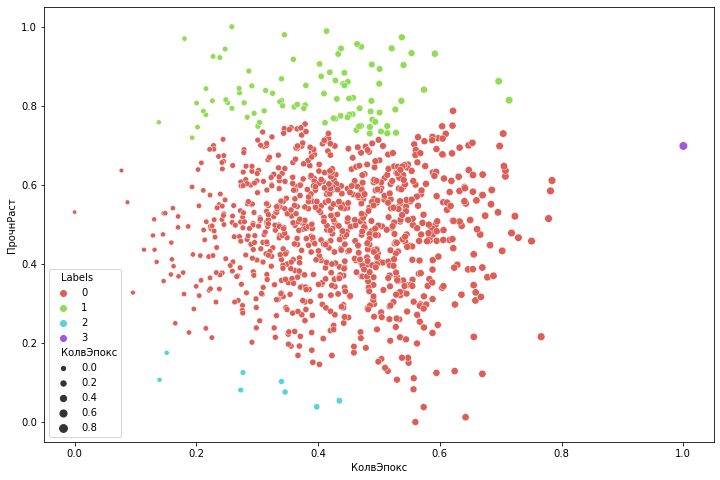

In [874]:
# AgglomerativeClustering показывает агломеративную кластеризацию
agglom = AgglomerativeClustering(n_clusters=4, linkage='average').fit(X.drop(['Labels'], axis=1)) # ward, complete...

X['Labels'] = agglom.labels_
plt.figure(figsize=(12, 8))
sns.scatterplot(x=X['КолвЭпокс'], y=X['ПрочнРаст'], hue=X['Labels'], size=X['КолвЭпокс'],
                palette=sns.color_palette('hls', 4))
plt.show()

In [875]:
# количество данных в кластерах
X[X['Labels']==0].count(),X[X['Labels']==1].count(),X[X['Labels']==2].count(),X[X['Labels']==3].count(),X[X['Labels']==4].count()

(КолвЭпокс    923
 ПрочнРаст    923
 Labels       923
 dtype: int64,
 КолвЭпокс    91
 ПрочнРаст    91
 Labels       91
 dtype: int64,
 КолвЭпокс    8
 ПрочнРаст    8
 Labels       8
 dtype: int64,
 КолвЭпокс    1
 ПрочнРаст    1
 Labels       1
 dtype: int64,
 КолвЭпокс    0
 ПрочнРаст    0
 Labels       0
 dtype: int64)

In [876]:
# The Silhouette Coefficient is calculated using the mean intra-cluster distance and the mean nearest-cluster distance for each sample
print("Silhouette score: {}".format(silhouette_score(X.drop(['Labels'], axis=1), X.Labels)))

Silhouette score: 0.23476821786588326


In [877]:
# The matrix nearest-cluster distance
dist = distance_matrix(X.drop(['Labels'], axis=1), X.drop(['Labels'], axis=1))
print(dist)

[[0.         0.07906864 0.57253319 ... 0.14999898 0.36739706 0.28243657]
 [0.07906864 0.         0.49346454 ... 0.12040478 0.40831063 0.20517213]
 [0.57253319 0.49346454 0.         ... 0.49707098 0.80455681 0.29915427]
 ...
 [0.14999898 0.12040478 0.49707098 ... 0.         0.32766339 0.19985112]
 [0.36739706 0.40831063 0.80455681 ... 0.32766339 0.         0.52013455]
 [0.28243657 0.20517213 0.29915427 ... 0.19985112 0.52013455 0.        ]]


In [878]:
hierarchy_clustering = hierarchy.linkage(dist, 'complete')

C:\Users\Admin\AppData\Local\Temp\ipykernel_7164\1577177698.py:1: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  hierarchy_clustering = hierarchy.linkage(dist, 'complete')


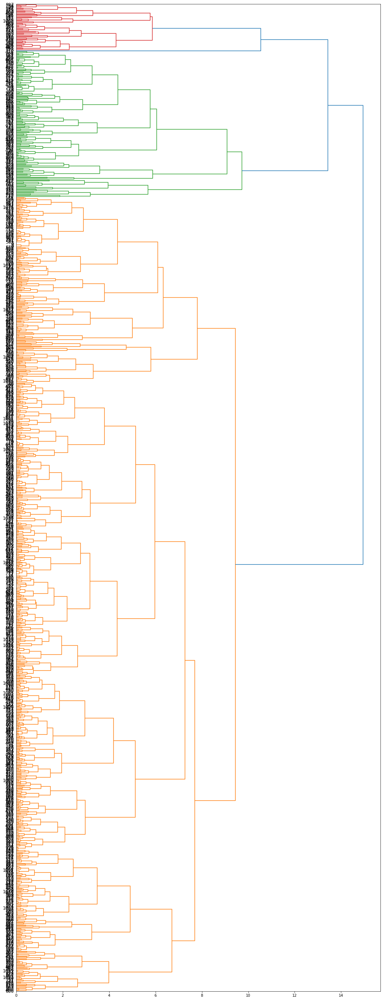

In [879]:
# dendrogram
plt.figure(figsize=(18, 50))
dendro = hierarchy.dendrogram(hierarchy_clustering, leaf_font_size=12, orientation='right')

###### 7. Исключить из параметров 'МатрНап', 'Плотн', 'МодУпр', 'КолвОтвер', 'КолвЭпокс', 'ПовПлотн', 'МодУпрРаст', 'КолвСмол', 'УголНаш', 'ШагНаш', 'ПлотнНаш', 'ДелРаст', 'Дел'

In [880]:
# Вывод сведений о названиях столбцов датасета df, метод columns
df.columns

Index(['МатрНап', 'Плотн', 'МодУпр', 'КолвОтвер', 'КолвЭпокс', 'ТемпВсп',
       'ПовПлотн', 'МодУпрРаст', 'ПрочнРаст', 'КолвСмол', 'УголНаш', 'ШагНаш',
       'ПлотнНаш', 'ДелРаст', 'Дел'],
      dtype='object')

In [881]:
# Назначение переменной X
X = df.drop(['МатрНап', 'Плотн', 'МодУпр', 'КолвОтвер', 'КолвЭпокс', 'ПовПлотн', 'МодУпрРаст', 'КолвСмол', 'УголНаш', 'ШагНаш', 'ПлотнНаш', 'ДелРаст', 'Дел'], axis=1)

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=4.
  warnings.warn(


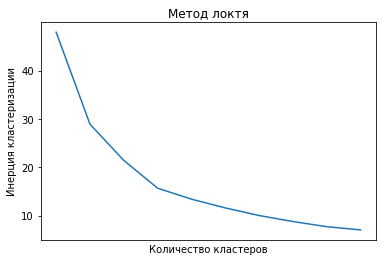

In [882]:
# Метод локтя
n_inertia = []

for i in range(1, 11):
    km = KMeans(n_clusters=i).fit(X)
    n_inertia.append(km.inertia_)
    
fig, ax = plt.subplots()
sns.lineplot(x=np.arange(1, 11), y=n_inertia, ax=ax)
ax.set_title('Метод локтя')
ax.set_xlabel('Количество кластеров')
ax.set_ylabel('Инерция кластеризации')
plt.xticks(np.arange(1, 1))
plt.show()
# ax.set_title('Метод локтя')
# ax.set_xlabel('Количество кластеров')
# ax.set_ylabel('Качество кластеризации')

In [883]:
# Вывод сведений о названиях столбцов датасета df, метод columns
df.columns

Index(['МатрНап', 'Плотн', 'МодУпр', 'КолвОтвер', 'КолвЭпокс', 'ТемпВсп',
       'ПовПлотн', 'МодУпрРаст', 'ПрочнРаст', 'КолвСмол', 'УголНаш', 'ШагНаш',
       'ПлотнНаш', 'ДелРаст', 'Дел'],
      dtype='object')

###### K-Means

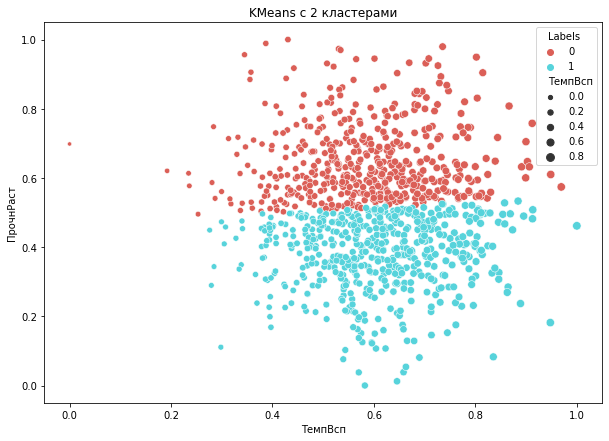

In [884]:
# KMeans показывает кластеризацию параметров
fig = plt.figure(figsize=(10,7))
km5 = KMeans(n_clusters=2).fit(X)
X['Labels'] = km5.labels_

sns.scatterplot(x=X['ТемпВсп'], y=X['ПрочнРаст'], hue=X['Labels'], size=X['ТемпВсп'], palette=sns.color_palette('hls', 2))

plt.title('KMeans c 2 кластерами')
plt.show()

In [885]:
# количество данных в кластерах
X[X['Labels']==0].count(),X[X['Labels']==1].count(),X[X['Labels']==2].count(),X[X['Labels']==3].count(),X[X['Labels']==4].count()

(ТемпВсп      488
 ПрочнРаст    488
 Labels       488
 dtype: int64,
 ТемпВсп      535
 ПрочнРаст    535
 Labels       535
 dtype: int64,
 ТемпВсп      0
 ПрочнРаст    0
 Labels       0
 dtype: int64,
 ТемпВсп      0
 ПрочнРаст    0
 Labels       0
 dtype: int64,
 ТемпВсп      0
 ПрочнРаст    0
 Labels       0
 dtype: int64)

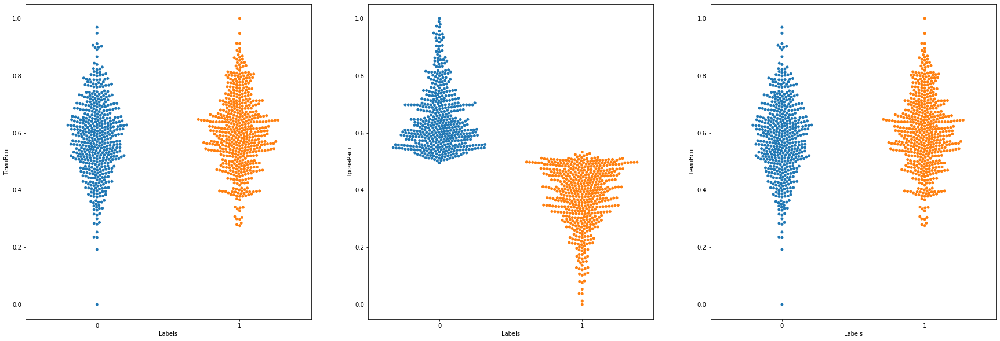

In [886]:
# swarmplot показывает распределение и разброс параметров по кластерам
fig = plt.figure(figsize=(30,10))
ax = fig.add_subplot(131)
sns.swarmplot(x='Labels', y='ТемпВсп', data=X, ax=ax)

ax = fig.add_subplot(132)
sns.swarmplot(x='Labels', y='ПрочнРаст', data=X, ax=ax)

ax = fig.add_subplot(133)
sns.swarmplot(x='Labels', y='ТемпВсп', data=X, ax=ax)

plt.show()

In [887]:
# The Silhouette Coefficient is calculated using the mean intra-cluster distance and the mean nearest-cluster distance for each sample
print("Silhouette score: {}".format(silhouette_score(X.drop(['Labels'], axis=1), X.Labels)))

Silhouette score: 0.34678451503993557


###### Иерархическая кластеризация (агломеративная)

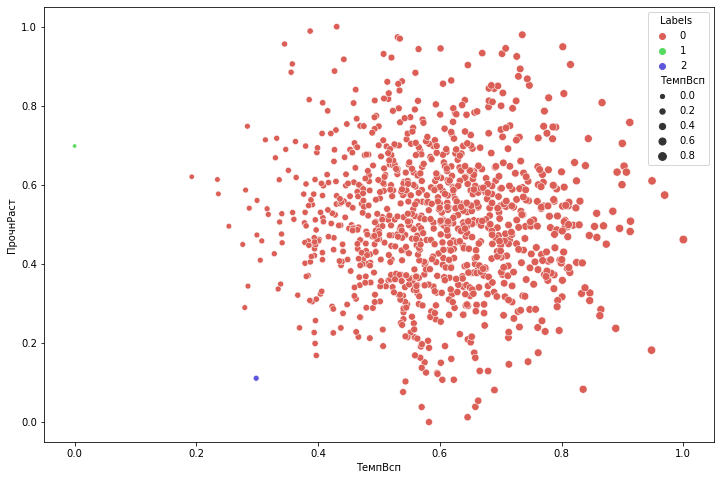

In [888]:
# AgglomerativeClustering показывает агломеративную кластеризацию
agglom = AgglomerativeClustering(n_clusters=3, linkage='average').fit(X.drop(['Labels'], axis=1)) # ward, complete...

X['Labels'] = agglom.labels_
plt.figure(figsize=(12, 8))
sns.scatterplot(x=X['ТемпВсп'], y=X['ПрочнРаст'], hue=X['Labels'], size=X['ТемпВсп'],
                palette=sns.color_palette('hls', 3))
plt.show()

In [889]:
# количество данных в кластерах
X[X['Labels']==0].count(),X[X['Labels']==1].count(),X[X['Labels']==2].count(),X[X['Labels']==3].count(),X[X['Labels']==4].count()

(ТемпВсп      1021
 ПрочнРаст    1021
 Labels       1021
 dtype: int64,
 ТемпВсп      1
 ПрочнРаст    1
 Labels       1
 dtype: int64,
 ТемпВсп      1
 ПрочнРаст    1
 Labels       1
 dtype: int64,
 ТемпВсп      0
 ПрочнРаст    0
 Labels       0
 dtype: int64,
 ТемпВсп      0
 ПрочнРаст    0
 Labels       0
 dtype: int64)

In [890]:
# The Silhouette Coefficient is calculated using the mean intra-cluster distance and the mean nearest-cluster distance for each sample
print("Silhouette score: {}".format(silhouette_score(X.drop(['Labels'], axis=1), X.Labels)))

Silhouette score: 0.4075514604154716


In [891]:
# The matrix nearest-cluster distance
dist = distance_matrix(X.drop(['Labels'], axis=1), X.drop(['Labels'], axis=1))
print(dist)

[[0.         0.58931072 0.58931072 ... 0.48871604 0.65103722 0.64349321]
 [0.58931072 0.         0.         ... 0.1664988  0.33136703 0.07301264]
 [0.58931072 0.         0.         ... 0.1664988  0.33136703 0.07301264]
 ...
 [0.48871604 0.1664988  0.1664988  ... 0.         0.22768206 0.18124381]
 [0.65103722 0.33136703 0.33136703 ... 0.22768206 0.         0.29040314]
 [0.64349321 0.07301264 0.07301264 ... 0.18124381 0.29040314 0.        ]]


In [892]:
hierarchy_clustering = hierarchy.linkage(dist, 'complete')

C:\Users\Admin\AppData\Local\Temp\ipykernel_7164\1577177698.py:1: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  hierarchy_clustering = hierarchy.linkage(dist, 'complete')


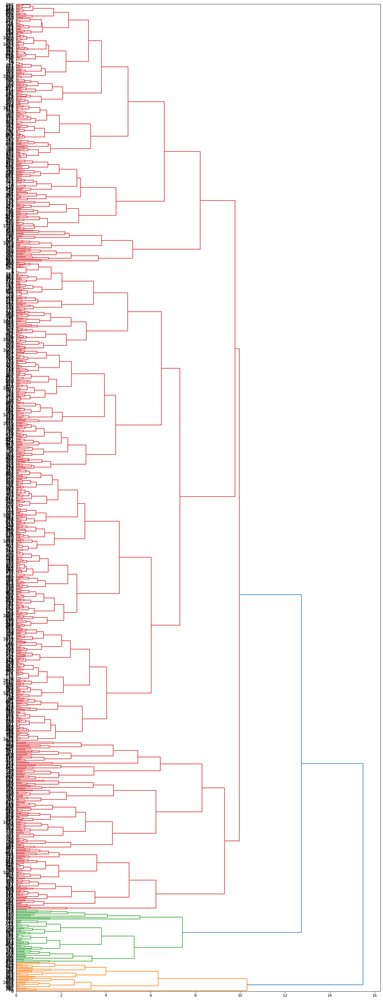

In [893]:
# dendrogram
plt.figure(figsize=(18, 50))
dendro = hierarchy.dendrogram(hierarchy_clustering, leaf_font_size=12, orientation='right')

###### 8. Исключить из параметров 'МатрНап', 'Плотн', 'МодУпр', 'КолвОтвер', 'КолвЭпокс', 'ТемпВсп', 'МодУпрРаст', 'КолвСмол', 'УголНаш', 'ШагНаш', 'ПлотнНаш', 'ДелРаст', 'Дел'

In [894]:
# Вывод сведений о названиях столбцов датасета df, метод columns
df.columns

Index(['МатрНап', 'Плотн', 'МодУпр', 'КолвОтвер', 'КолвЭпокс', 'ТемпВсп',
       'ПовПлотн', 'МодУпрРаст', 'ПрочнРаст', 'КолвСмол', 'УголНаш', 'ШагНаш',
       'ПлотнНаш', 'ДелРаст', 'Дел'],
      dtype='object')

In [895]:
# Назначение переменной X
X = df.drop(['МатрНап', 'Плотн', 'МодУпр', 'КолвОтвер', 'КолвЭпокс', 'ТемпВсп', 'МодУпрРаст', 'КолвСмол', 'УголНаш', 'ШагНаш', 'ПлотнНаш', 'ДелРаст', 'Дел'], axis=1)

###### K-Means

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=4.
  warnings.warn(


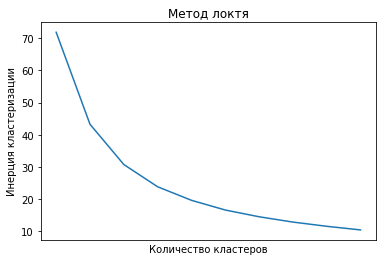

In [896]:
# Метод локтя
n_inertia = []

for i in range(1, 11):
    km = KMeans(n_clusters=i).fit(X)
    n_inertia.append(km.inertia_)
    
fig, ax = plt.subplots()
sns.lineplot(x=np.arange(1, 11), y=n_inertia, ax=ax)
ax.set_title('Метод локтя')
ax.set_xlabel('Количество кластеров')
ax.set_ylabel('Инерция кластеризации')
plt.xticks(np.arange(1, 1))
plt.show()
# ax.set_title('Метод локтя')
# ax.set_xlabel('Количество кластеров')
# ax.set_ylabel('Качество кластеризации')

In [897]:
# Вывод сведений о названиях столбцов датасета df, метод columns
df.columns

Index(['МатрНап', 'Плотн', 'МодУпр', 'КолвОтвер', 'КолвЭпокс', 'ТемпВсп',
       'ПовПлотн', 'МодУпрРаст', 'ПрочнРаст', 'КолвСмол', 'УголНаш', 'ШагНаш',
       'ПлотнНаш', 'ДелРаст', 'Дел'],
      dtype='object')

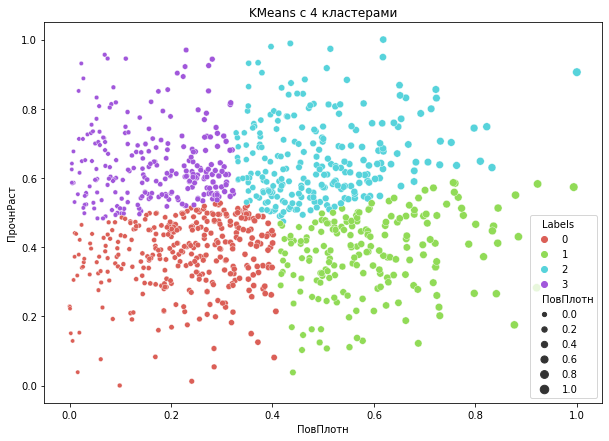

In [898]:
# KMeans показывает кластеризацию параметров
fig = plt.figure(figsize=(10,7))
km5 = KMeans(n_clusters=4).fit(X)
X['Labels'] = km5.labels_

sns.scatterplot(x=X['ПовПлотн'], y=X['ПрочнРаст'], hue=X['Labels'], size=X['ПовПлотн'], palette=sns.color_palette('hls', 4))

plt.title('KMeans c 4 кластерами')
plt.show()

In [899]:
# количество данных в кластерах
X[X['Labels']==0].count(),X[X['Labels']==1].count(),X[X['Labels']==2].count(),X[X['Labels']==3].count()

(ПовПлотн     333
 ПрочнРаст    333
 Labels       333
 dtype: int64,
 ПовПлотн     194
 ПрочнРаст    194
 Labels       194
 dtype: int64,
 ПовПлотн     242
 ПрочнРаст    242
 Labels       242
 dtype: int64,
 ПовПлотн     254
 ПрочнРаст    254
 Labels       254
 dtype: int64)

In [900]:
# данные в кластерах по 'ПрочнРаст'
X[X['Labels']==0]['ПрочнРаст'],X[X['Labels']==1]['ПрочнРаст'],X[X['Labels']==2]['ПрочнРаст'],X[X['Labels']==3]['ПрочнРаст']

(7       0.271429
 8       0.271429
 12      0.504591
 13      0.504591
 14      0.504591
           ...   
 1010    0.317909
 1012    0.378053
 1013    0.320976
 1018    0.480312
 1019    0.470745
 Name: ПрочнРаст, Length: 333, dtype: float64,
 9       0.342563
 10      0.342563
 11      0.342563
 19      0.342563
 20      0.342563
           ...   
 989     0.484583
 991     0.526911
 1002    0.330709
 1015    0.500297
 1021    0.368070
 Name: ПрочнРаст, Length: 194, dtype: float64,
 23      0.551464
 24      0.949223
 25      0.564512
 27      0.719231
 29      0.593114
           ...   
 1004    0.616017
 1014    0.526985
 1016    0.508635
 1020    0.578340
 1022    0.647135
 Name: ПрочнРаст, Length: 242, dtype: float64,
 0       0.698235
 1       0.698235
 2       0.698235
 3       0.698235
 4       0.698235
           ...   
 1007    0.552009
 1008    0.943372
 1009    0.548075
 1011    0.695045
 1017    0.734705
 Name: ПрочнРаст, Length: 254, dtype: float64)

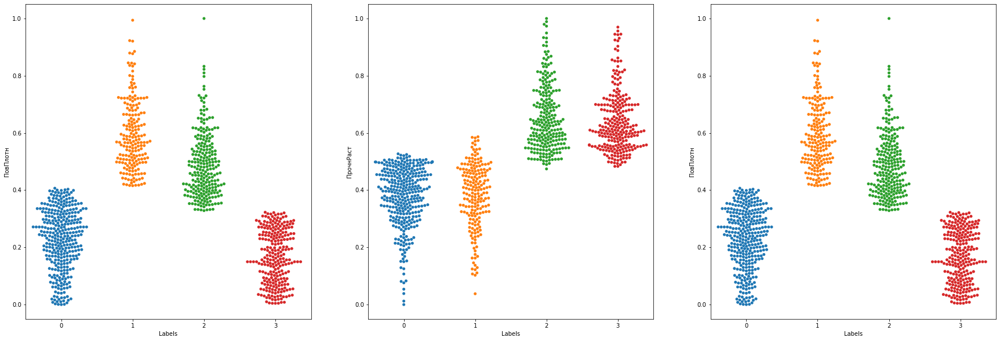

In [901]:
# swarmplot показывает распределение и разброс параметров по кластерам
fig = plt.figure(figsize=(30,10))
ax = fig.add_subplot(131)
sns.swarmplot(x='Labels', y='ПовПлотн', data=X, ax=ax)

ax = fig.add_subplot(132)
sns.swarmplot(x='Labels', y='ПрочнРаст', data=X, ax=ax)

ax = fig.add_subplot(133)
sns.swarmplot(x='Labels', y='ПовПлотн', data=X, ax=ax)

plt.show()

In [902]:
# The Silhouette Coefficient is calculated using the mean intra-cluster distance and the mean nearest-cluster distance for each sample
print("Silhouette score: {}".format(silhouette_score(X.drop(['Labels'], axis=1), X.Labels)))

Silhouette score: 0.33388111211145294


###### Иерархическая кластеризация (агломеративная)

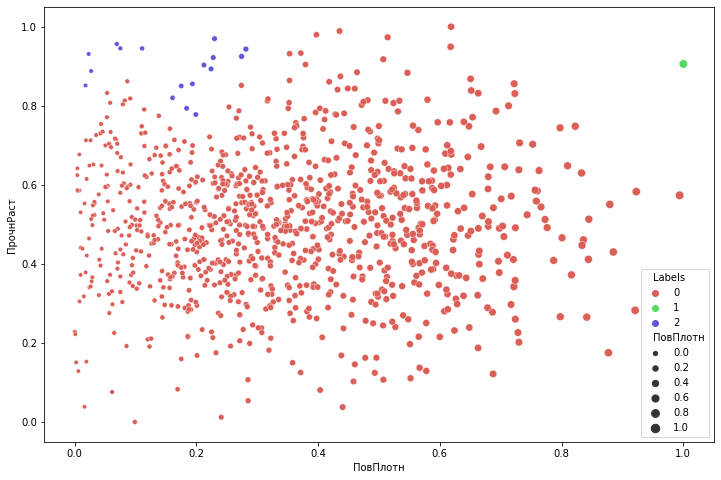

In [903]:
# AgglomerativeClustering показывает агломеративную кластеризацию
agglom = AgglomerativeClustering(n_clusters=3, linkage='average').fit(X.drop(['Labels'], axis=1)) # ward, complete...

X['Labels'] = agglom.labels_
plt.figure(figsize=(12, 8))
sns.scatterplot(x=X['ПовПлотн'], y=X['ПрочнРаст'], hue=X['Labels'], size=X['ПовПлотн'],
                palette=sns.color_palette('hls', 3))
plt.show()

In [904]:
# количество данных в кластерах
X[X['Labels']==0].count(),X[X['Labels']==1].count(),X[X['Labels']==2].count(),X[X['Labels']==3].count(),X[X['Labels']==4].count()

(ПовПлотн     1005
 ПрочнРаст    1005
 Labels       1005
 dtype: int64,
 ПовПлотн     1
 ПрочнРаст    1
 Labels       1
 dtype: int64,
 ПовПлотн     17
 ПрочнРаст    17
 Labels       17
 dtype: int64,
 ПовПлотн     0
 ПрочнРаст    0
 Labels       0
 dtype: int64,
 ПовПлотн     0
 ПрочнРаст    0
 Labels       0
 dtype: int64)

In [905]:
# данные в кластерах по 'ПрочнРаст'
X[X['Labels']==0]['ПрочнРаст'],X[X['Labels']==1]['ПрочнРаст'],X[X['Labels']==2]['ПрочнРаст'],X[X['Labels']==3]['ПрочнРаст'],X[X['Labels']==4]['ПрочнРаст']

(0       0.698235
 1       0.698235
 2       0.698235
 3       0.698235
 4       0.698235
           ...   
 1018    0.480312
 1019    0.470745
 1020    0.578340
 1021    0.368070
 1022    0.647135
 Name: ПрочнРаст, Length: 1005, dtype: float64,
 692    0.905772
 Name: ПрочнРаст, dtype: float64,
 99      0.956165
 201     0.820160
 258     0.930999
 276     0.893163
 326     0.850222
 335     0.921909
 395     0.855358
 428     0.777766
 523     0.924760
 533     0.851505
 535     0.902956
 589     0.887811
 654     0.945177
 695     0.969771
 897     0.944956
 993     0.793434
 1008    0.943372
 Name: ПрочнРаст, dtype: float64,
 Series([], Name: ПрочнРаст, dtype: float64),
 Series([], Name: ПрочнРаст, dtype: float64))

In [906]:
# The Silhouette Coefficient is calculated using the mean intra-cluster distance and the mean nearest-cluster distance for each sample
print("Silhouette score: {}".format(silhouette_score(X.drop(['Labels'], axis=1), X.Labels)))

Silhouette score: 0.2554407445070297


In [907]:
# The matrix nearest-cluster distance
dist = distance_matrix(X.drop(['Labels'], axis=1), X.drop(['Labels'], axis=1))
print(dist)

[[0.         0.         0.         ... 0.39747453 0.45181285 0.39557454]
 [0.         0.         0.         ... 0.39747453 0.45181285 0.39557454]
 [0.         0.         0.         ... 0.39747453 0.45181285 0.39557454]
 ...
 [0.39747453 0.39747453 0.39747453 ... 0.         0.22178502 0.07006881]
 [0.45181285 0.45181285 0.45181285 ... 0.22178502 0.         0.29138538]
 [0.39557454 0.39557454 0.39557454 ... 0.07006881 0.29138538 0.        ]]


In [908]:
hierarchy_clustering = hierarchy.linkage(dist, 'complete')

C:\Users\Admin\AppData\Local\Temp\ipykernel_7164\1577177698.py:1: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  hierarchy_clustering = hierarchy.linkage(dist, 'complete')


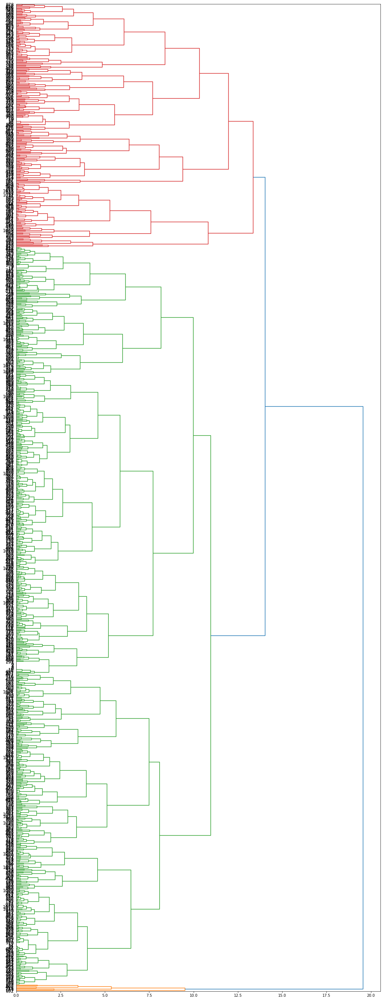

In [909]:
# dendrogram
plt.figure(figsize=(18, 50))
dendro = hierarchy.dendrogram(hierarchy_clustering, leaf_font_size=12, orientation='right')

### DBSCAN

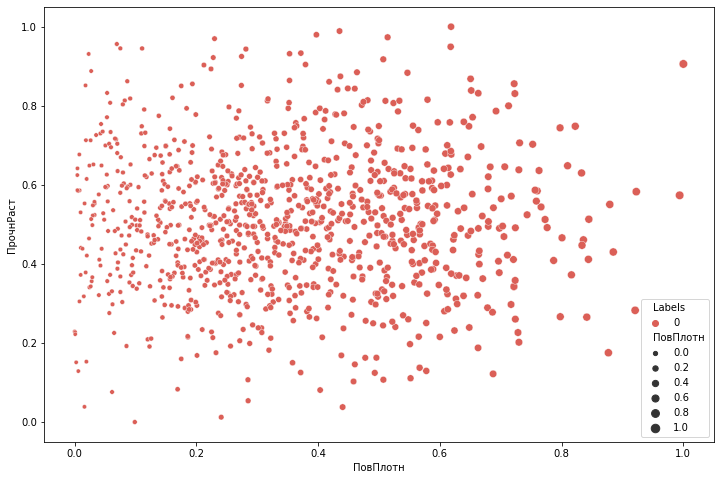

In [910]:
# кластеризация DBSCAN
from sklearn.cluster import DBSCAN 

db = DBSCAN(eps=100, min_samples=4).fit(X.drop(['Labels'], axis=1))

X['Labels'] = db.labels_
plt.figure(figsize=(12, 8))
sns.scatterplot(x=X['ПовПлотн'], y=X['ПрочнРаст'], hue=X['Labels'], size=X['ПовПлотн'],
                palette=sns.color_palette('hls', np.unique(db.labels_).shape[0]))
plt.show()

In [911]:
# The Silhouette Coefficient is calculated using the mean intra-cluster distance and the mean nearest-cluster distance for each sample
# print("Silhouette score: {}".format(silhouette_score(X.drop(['Labels'], axis=1), X.Labels)))

### C-means

In [912]:
# C-mean подобно KMeans показывает кластеризацию параметров
X.drop(['Labels'], axis=1, inplace=True)
fcm = FCM(n_clusters=4)
fcm.fit(X.values)

fcm_centers = fcm.centers
fcm_labels = fcm.predict(X.values) 

In [913]:
X['Labels'] = fcm_labels

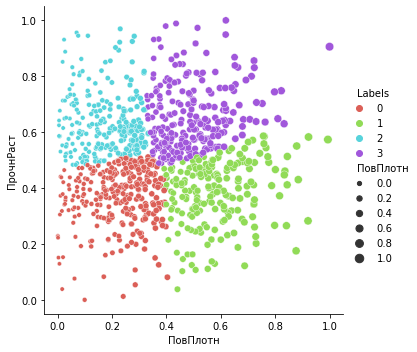

In [914]:
sns.relplot(x='ПовПлотн', y='ПрочнРаст', hue='Labels', 
            size='ПовПлотн', data=X, palette = sns.color_palette('hls', 4))

In [915]:
# The Silhouette Coefficient is calculated using the mean intra-cluster distance and the mean nearest-cluster distance for each sample
X[X['Labels']==0].count(),X[X['Labels']==1].count(),X[X['Labels']==2].count(),X[X['Labels']==3].count()

(ПовПлотн     311
 ПрочнРаст    311
 Labels       311
 dtype: int64,
 ПовПлотн     205
 ПрочнРаст    205
 Labels       205
 dtype: int64,
 ПовПлотн     266
 ПрочнРаст    266
 Labels       266
 dtype: int64,
 ПовПлотн     241
 ПрочнРаст    241
 Labels       241
 dtype: int64)

In [916]:
# количество данных в кластерах
X[X['Labels']==0]['ПрочнРаст'],X[X['Labels']==1]['ПрочнРаст'],X[X['Labels']==2]['ПрочнРаст'],X[X['Labels']==3]['ПрочнРаст']

(7       0.271429
 8       0.271429
 12      0.504591
 13      0.504591
 14      0.504591
           ...   
 1010    0.317909
 1012    0.378053
 1013    0.320976
 1018    0.480312
 1019    0.470745
 Name: ПрочнРаст, Length: 311, dtype: float64,
 9       0.342563
 10      0.342563
 11      0.342563
 19      0.342563
 20      0.342563
           ...   
 989     0.484583
 991     0.526911
 1002    0.330709
 1015    0.500297
 1021    0.368070
 Name: ПрочнРаст, Length: 205, dtype: float64,
 0       0.698235
 1       0.698235
 2       0.698235
 3       0.698235
 4       0.698235
           ...   
 1007    0.552009
 1008    0.943372
 1009    0.548075
 1011    0.695045
 1017    0.734705
 Name: ПрочнРаст, Length: 266, dtype: float64,
 23      0.551464
 24      0.949223
 25      0.564512
 27      0.719231
 29      0.593114
           ...   
 1004    0.616017
 1014    0.526985
 1016    0.508635
 1020    0.578340
 1022    0.647135
 Name: ПрочнРаст, Length: 241, dtype: float64)

In [917]:
# The Silhouette Coefficient is calculated using the mean intra-cluster distance and the mean nearest-cluster distance for each sample
print("Silhouette score: {}".format(silhouette_score(X.drop(['Labels'], axis=1), X.Labels)))

Silhouette score: 0.330168195096557


Проверка значимости различия по критерию Краскала-Уоллиса

In [918]:
# индексация кластеров
filter_0 = X[X['Labels']==0].index
filter_1 = X[X['Labels']==1].index
filter_2 = X[X['Labels']==2].index
filter_3 = X[X['Labels']==3].index

In [919]:
# выделение объектов np.array
df_0 = np.array(df_s['ПрочнРаст'][filter_0].reset_index(drop=True))
df_1 = np.array(df_s['ПрочнРаст'][filter_1].reset_index(drop=True))
df_2 = np.array(df_s['ПрочнРаст'][filter_2].reset_index(drop=True))
df_3 = np.array(df_s['ПрочнРаст'][filter_3].reset_index(drop=True))

In [920]:
# критерий Краскала-Уоллиса
stats.mstats.kruskalwallis(df_0,df_1,df_2,df_3)

KruskalResult(statistic=736.7889456671963, pvalue=2.2106151584373816e-159)

Вывод: различия по группам статистически значимы по параметру 'ПовПлотн'

###### 9. Исключить из параметров 'МатрНап', 'Плотн', 'МодУпр', 'КолвОтвер', 'КолвЭпокс', 'ТемпВсп', 'ПовПлотн', 'КолвСмол', 'УголНаш', 'ШагНаш', 'ПлотнНаш', 'ДелРаст', 'Дел'

In [921]:
# Вывод сведений о названиях столбцов датасета df, метод columns
df.columns

Index(['МатрНап', 'Плотн', 'МодУпр', 'КолвОтвер', 'КолвЭпокс', 'ТемпВсп',
       'ПовПлотн', 'МодУпрРаст', 'ПрочнРаст', 'КолвСмол', 'УголНаш', 'ШагНаш',
       'ПлотнНаш', 'ДелРаст', 'Дел'],
      dtype='object')

In [922]:
# Назначение переменной X
X = df.drop(['МатрНап', 'Плотн', 'МодУпр', 'КолвОтвер', 'КолвЭпокс', 'ТемпВсп', 'ПовПлотн', 'КолвСмол', 'УголНаш', 'ШагНаш', 'ПлотнНаш', 'ДелРаст', 'Дел'], axis=1)

###### K-Means

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=4.
  warnings.warn(


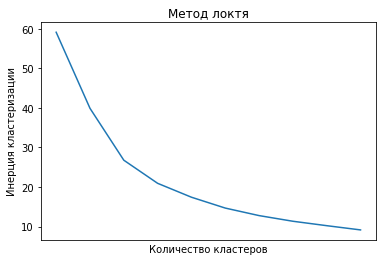

In [923]:
# Метод локтя
n_inertia = []

for i in range(1, 11):
    km = KMeans(n_clusters=i).fit(X)
    n_inertia.append(km.inertia_)
    
fig, ax = plt.subplots()
sns.lineplot(x=np.arange(1, 11), y=n_inertia, ax=ax)
ax.set_title('Метод локтя')
ax.set_xlabel('Количество кластеров')
ax.set_ylabel('Инерция кластеризации')
plt.xticks(np.arange(1, 1))
plt.show()
# ax.set_title('Метод локтя')
# ax.set_xlabel('Количество кластеров')
# ax.set_ylabel('Качество кластеризации')

In [924]:
# Вывод сведений о названиях столбцов датасета df, метод columns
df.columns

Index(['МатрНап', 'Плотн', 'МодУпр', 'КолвОтвер', 'КолвЭпокс', 'ТемпВсп',
       'ПовПлотн', 'МодУпрРаст', 'ПрочнРаст', 'КолвСмол', 'УголНаш', 'ШагНаш',
       'ПлотнНаш', 'ДелРаст', 'Дел'],
      dtype='object')

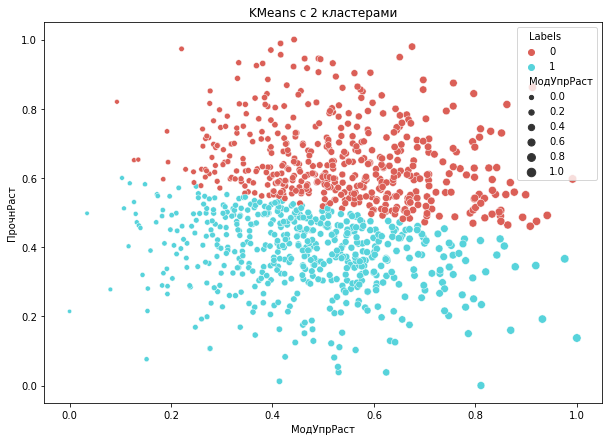

In [925]:
# KMeans показывает кластеризацию параметров
fig = plt.figure(figsize=(10,7))
km5 = KMeans(n_clusters=2).fit(X)
X['Labels'] = km5.labels_

sns.scatterplot(x=X['МодУпрРаст'], y=X['ПрочнРаст'], hue=X['Labels'], size=X['МодУпрРаст'], palette=sns.color_palette('hls', 2))

plt.title('KMeans c 2 кластерами')
plt.show()

In [926]:
# количество данных в кластерах
X[X['Labels']==0].count(),X[X['Labels']==1].count(),X[X['Labels']==2].count(),X[X['Labels']==3].count(),X[X['Labels']==4].count()

(МодУпрРаст    487
 ПрочнРаст     487
 Labels        487
 dtype: int64,
 МодУпрРаст    536
 ПрочнРаст     536
 Labels        536
 dtype: int64,
 МодУпрРаст    0
 ПрочнРаст     0
 Labels        0
 dtype: int64,
 МодУпрРаст    0
 ПрочнРаст     0
 Labels        0
 dtype: int64,
 МодУпрРаст    0
 ПрочнРаст     0
 Labels        0
 dtype: int64)

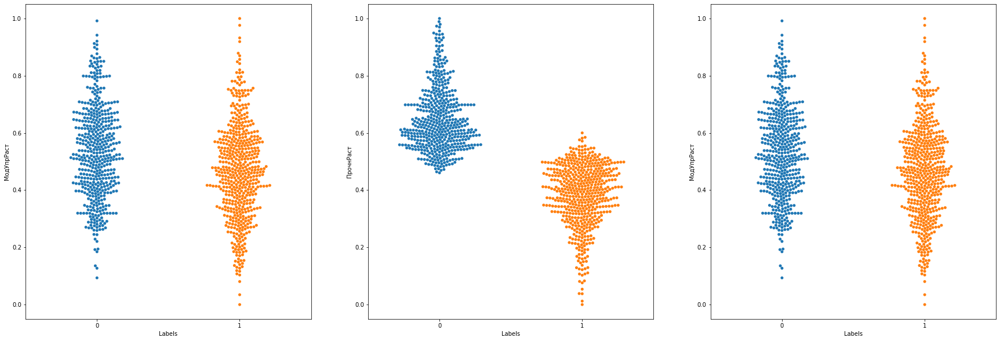

In [927]:
# swarmplot показывает распределение и разброс параметров по кластерам
fig = plt.figure(figsize=(30,10))
ax = fig.add_subplot(131)
sns.swarmplot(x='Labels', y='МодУпрРаст', data=X, ax=ax)

ax = fig.add_subplot(132)
sns.swarmplot(x='Labels', y='ПрочнРаст', data=X, ax=ax)

ax = fig.add_subplot(133)
sns.swarmplot(x='Labels', y='МодУпрРаст', data=X, ax=ax)

plt.show()

In [928]:
# The Silhouette Coefficient is calculated using the mean intra-cluster distance and the mean nearest-cluster distance for each sample
print("Silhouette score: {}".format(silhouette_score(X.drop(['Labels'], axis=1), X.Labels)))

Silhouette score: 0.3063751477896361


###### Иерархическая кластеризация (агломеративная)

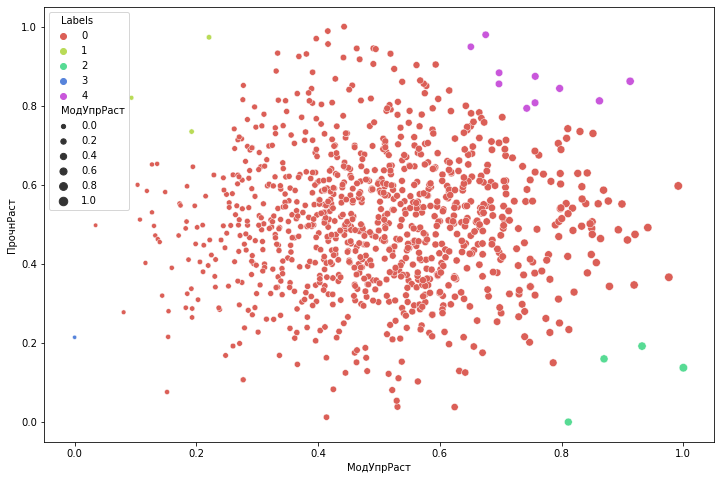

In [929]:
# AgglomerativeClustering показывает агломеративную кластеризацию
agglom = AgglomerativeClustering(n_clusters=5, linkage='average').fit(X.drop(['Labels'], axis=1)) # ward, complete...

X['Labels'] = agglom.labels_
plt.figure(figsize=(12, 8))
sns.scatterplot(x=X['МодУпрРаст'], y=X['ПрочнРаст'], hue=X['Labels'], size=X['МодУпрРаст'],
                palette=sns.color_palette('hls', 5))
plt.show()

In [930]:
# количество данных в кластерах
X[X['Labels']==0].count(),X[X['Labels']==1].count(),X[X['Labels']==2].count(),X[X['Labels']==3].count(),X[X['Labels']==4].count()

(МодУпрРаст    1005
 ПрочнРаст     1005
 Labels        1005
 dtype: int64,
 МодУпрРаст    3
 ПрочнРаст     3
 Labels        3
 dtype: int64,
 МодУпрРаст    4
 ПрочнРаст     4
 Labels        4
 dtype: int64,
 МодУпрРаст    1
 ПрочнРаст     1
 Labels        1
 dtype: int64,
 МодУпрРаст    10
 ПрочнРаст     10
 Labels        10
 dtype: int64)

In [931]:
# The Silhouette Coefficient is calculated using the mean intra-cluster distance and the mean nearest-cluster distance for each sample
print("Silhouette score: {}".format(silhouette_score(X.drop(['Labels'], axis=1), X.Labels)))

Silhouette score: 0.14063273473947174


In [932]:
# The matrix nearest-cluster distance
dist = distance_matrix(X.drop(['Labels'], axis=1), X.drop(['Labels'], axis=1))
print(dist)

[[0.         0.         0.         ... 0.28101261 0.39510475 0.23693237]
 [0.         0.         0.         ... 0.28101261 0.39510475 0.23693237]
 [0.         0.         0.         ... 0.28101261 0.39510475 0.23693237]
 ...
 [0.28101261 0.28101261 0.28101261 ... 0.         0.21352261 0.07247352]
 [0.39510475 0.39510475 0.39510475 ... 0.21352261 0.         0.27943265]
 [0.23693237 0.23693237 0.23693237 ... 0.07247352 0.27943265 0.        ]]


In [933]:
hierarchy_clustering = hierarchy.linkage(dist, 'complete')

C:\Users\Admin\AppData\Local\Temp\ipykernel_7164\1577177698.py:1: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  hierarchy_clustering = hierarchy.linkage(dist, 'complete')


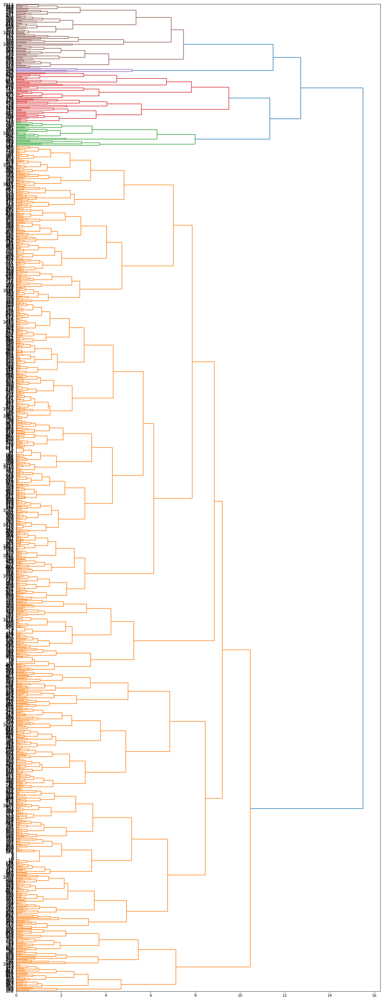

In [934]:
# dendrogram
plt.figure(figsize=(18, 50))
dendro = hierarchy.dendrogram(hierarchy_clustering, leaf_font_size=12, orientation='right')

###### 10. Исключить из параметров 'МатрНап', 'Плотн', 'МодУпр', 'КолвОтвер', 'КолвЭпокс', 'ТемпВсп', 'ПовПлотн', 'МодУпрРаст', 'УголНаш', 'ШагНаш', 'ПлотнНаш', 'ДелРаст', 'Дел'

In [935]:
# Вывод сведений о названиях столбцов датасета df, метод columns
df.columns

Index(['МатрНап', 'Плотн', 'МодУпр', 'КолвОтвер', 'КолвЭпокс', 'ТемпВсп',
       'ПовПлотн', 'МодУпрРаст', 'ПрочнРаст', 'КолвСмол', 'УголНаш', 'ШагНаш',
       'ПлотнНаш', 'ДелРаст', 'Дел'],
      dtype='object')

In [936]:
# Назначение переменной X
X = df.drop(['МатрНап', 'Плотн', 'МодУпр', 'КолвОтвер', 'КолвЭпокс', 'ТемпВсп', 'ПовПлотн', 'МодУпрРаст', 'УголНаш', 'ШагНаш', 'ПлотнНаш', 'ДелРаст', 'Дел'], axis=1)

###### K-Means

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=4.
  warnings.warn(


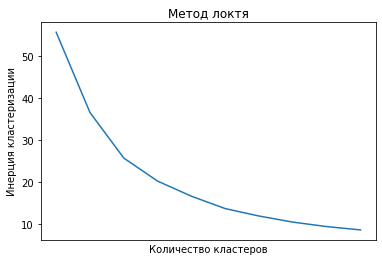

In [937]:
# Метод локтя
n_inertia = []

for i in range(1, 11):
    km = KMeans(n_clusters=i).fit(X)
    n_inertia.append(km.inertia_)
    
fig, ax = plt.subplots()
sns.lineplot(x=np.arange(1, 11), y=n_inertia, ax=ax)
ax.set_title('Метод локтя')
ax.set_xlabel('Количество кластеров')
ax.set_ylabel('Инерция кластеризации')
plt.xticks(np.arange(1, 1))
plt.show()
# ax.set_title('Метод локтя')
# ax.set_xlabel('Количество кластеров')
# ax.set_ylabel('Качество кластеризации')

In [938]:
# Вывод сведений о названиях столбцов датасета df, метод columns
df.columns

Index(['МатрНап', 'Плотн', 'МодУпр', 'КолвОтвер', 'КолвЭпокс', 'ТемпВсп',
       'ПовПлотн', 'МодУпрРаст', 'ПрочнРаст', 'КолвСмол', 'УголНаш', 'ШагНаш',
       'ПлотнНаш', 'ДелРаст', 'Дел'],
      dtype='object')

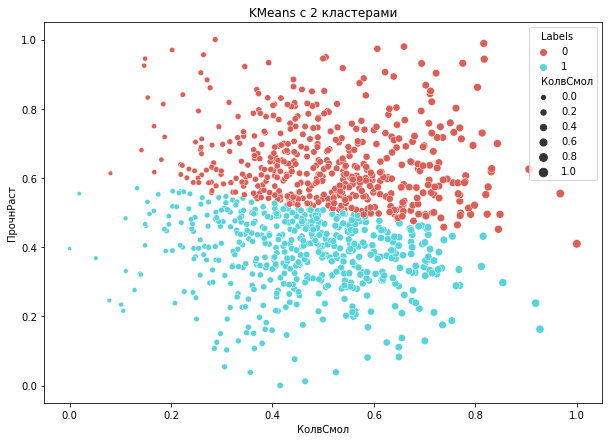

In [939]:
# KMeans показывает кластеризацию параметров
fig = plt.figure(figsize=(10,7))
km5 = KMeans(n_clusters=2).fit(X)
X['Labels'] = km5.labels_

sns.scatterplot(x=X['КолвСмол'], y=X['ПрочнРаст'], hue=X['Labels'], size=X['КолвСмол'], palette=sns.color_palette('hls', 2))

plt.title('KMeans c 2 кластерами')
plt.show()

In [940]:
# количество данных в кластерах
X[X['Labels']==0].count(),X[X['Labels']==1].count(),X[X['Labels']==2].count(),X[X['Labels']==3].count(),X[X['Labels']==4].count()

(ПрочнРаст    499
 КолвСмол     499
 Labels       499
 dtype: int64,
 ПрочнРаст    524
 КолвСмол     524
 Labels       524
 dtype: int64,
 ПрочнРаст    0
 КолвСмол     0
 Labels       0
 dtype: int64,
 ПрочнРаст    0
 КолвСмол     0
 Labels       0
 dtype: int64,
 ПрочнРаст    0
 КолвСмол     0
 Labels       0
 dtype: int64)

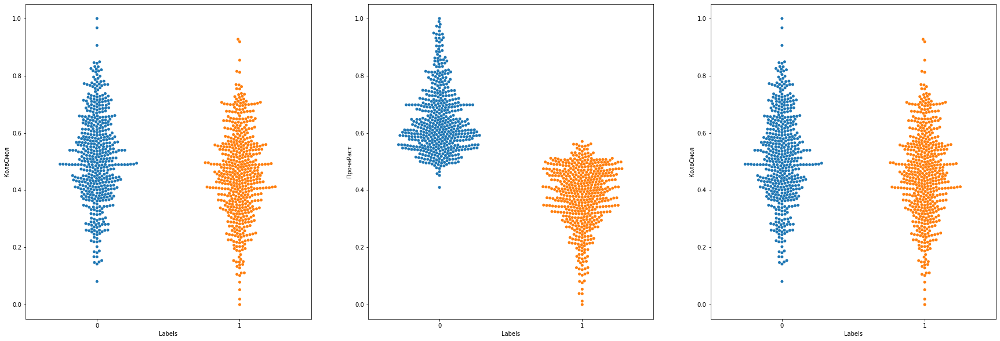

In [941]:
# swarmplot показывает распределение и разброс параметров по кластерам
fig = plt.figure(figsize=(30,10))
ax = fig.add_subplot(131)
sns.swarmplot(x='Labels', y='КолвСмол', data=X, ax=ax)

ax = fig.add_subplot(132)
sns.swarmplot(x='Labels', y='ПрочнРаст', data=X, ax=ax)

ax = fig.add_subplot(133)
sns.swarmplot(x='Labels', y='КолвСмол', data=X, ax=ax)

plt.show()

In [942]:
# The Silhouette Coefficient is calculated using the mean intra-cluster distance and the mean nearest-cluster distance for each sample
print("Silhouette score: {}".format(silhouette_score(X.drop(['Labels'], axis=1), X.Labels)))

Silhouette score: 0.3125296761674718


###### Иерархическая кластеризация (агломеративная)

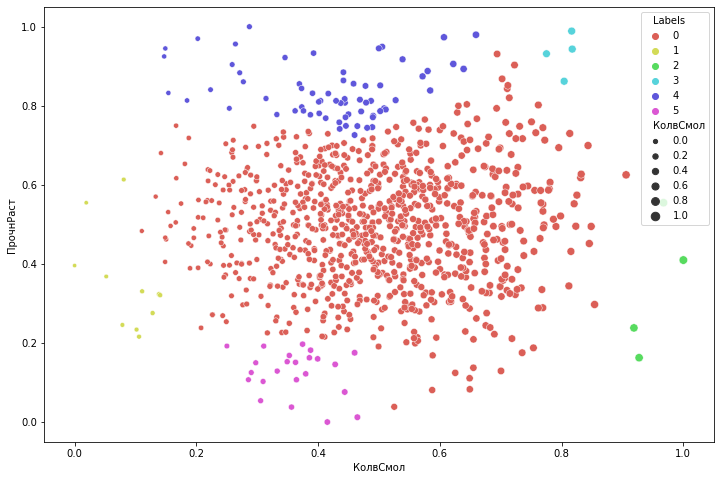

In [943]:
# AgglomerativeClustering показывает агломеративную кластеризацию
agglom = AgglomerativeClustering(n_clusters=6, linkage='average').fit(X.drop(['Labels'], axis=1)) # ward, complete...

X['Labels'] = agglom.labels_
plt.figure(figsize=(12, 8))
sns.scatterplot(x=X['КолвСмол'], y=X['ПрочнРаст'], hue=X['Labels'], size=X['КолвСмол'],
                palette=sns.color_palette('hls', 6))
plt.show()

In [944]:
# количество данных в кластерах
X[X['Labels']==0].count(),X[X['Labels']==1].count(),X[X['Labels']==2].count(),X[X['Labels']==3].count(),X[X['Labels']==4].count()

(ПрочнРаст    915
 КолвСмол     915
 Labels       915
 dtype: int64,
 ПрочнРаст    11
 КолвСмол     11
 Labels       11
 dtype: int64,
 ПрочнРаст    4
 КолвСмол     4
 Labels       4
 dtype: int64,
 ПрочнРаст    4
 КолвСмол     4
 Labels       4
 dtype: int64,
 ПрочнРаст    66
 КолвСмол     66
 Labels       66
 dtype: int64)

In [945]:
# The Silhouette Coefficient is calculated using the mean intra-cluster distance and the mean nearest-cluster distance for each sample
print("Silhouette score: {}".format(silhouette_score(X.drop(['Labels'], axis=1), X.Labels)))

Silhouette score: 0.12825512451769555


In [946]:
# The matrix nearest-cluster distance
dist = distance_matrix(X.drop(['Labels'], axis=1), X.drop(['Labels'], axis=1))
print(dist)

[[0.         0.         0.         ... 0.12758035 0.33558465 0.08370592]
 [0.         0.         0.         ... 0.12758035 0.33558465 0.08370592]
 [0.         0.         0.         ... 0.12758035 0.33558465 0.08370592]
 ...
 [0.12758035 0.12758035 0.12758035 ... 0.         0.23444242 0.12966497]
 [0.33558465 0.33558465 0.33558465 ... 0.23444242 0.         0.27913431]
 [0.08370592 0.08370592 0.08370592 ... 0.12966497 0.27913431 0.        ]]


In [947]:
hierarchy_clustering = hierarchy.linkage(dist, 'complete')

C:\Users\Admin\AppData\Local\Temp\ipykernel_7164\1577177698.py:1: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  hierarchy_clustering = hierarchy.linkage(dist, 'complete')


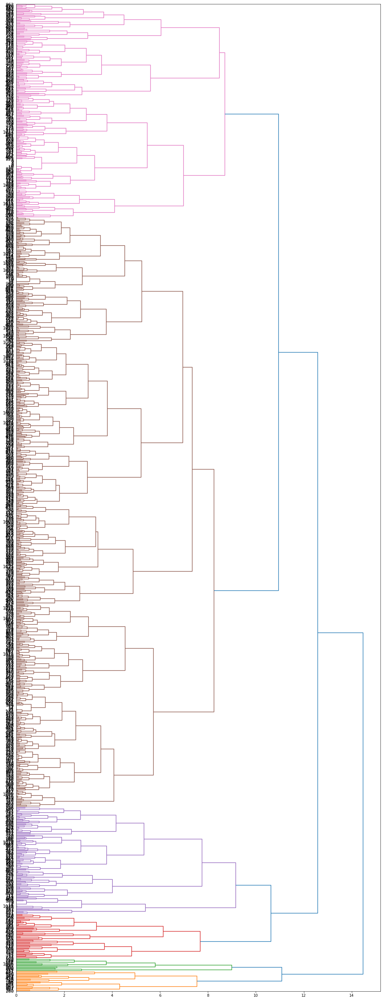

In [948]:
# dendrogram
plt.figure(figsize=(18, 50))
dendro = hierarchy.dendrogram(hierarchy_clustering, leaf_font_size=12, orientation='right')

###### 11. Исключить из параметров 'МатрНап', 'Плотн', 'МодУпр', 'КолвОтвер', 'КолвЭпокс', 'ТемпВсп', 'ПовПлотн', 'МодУпрРаст', 'КолвСмол', 'УголНаш', 'ПлотнНаш', 'ДелРаст', 'Дел'

In [949]:
# Вывод сведений о названиях столбцов датасета df, метод columns
df.columns

Index(['МатрНап', 'Плотн', 'МодУпр', 'КолвОтвер', 'КолвЭпокс', 'ТемпВсп',
       'ПовПлотн', 'МодУпрРаст', 'ПрочнРаст', 'КолвСмол', 'УголНаш', 'ШагНаш',
       'ПлотнНаш', 'ДелРаст', 'Дел'],
      dtype='object')

In [950]:
# Назначение переменной X
X = df.drop(['МатрНап', 'Плотн', 'МодУпр', 'КолвОтвер', 'КолвЭпокс', 'ТемпВсп', 'ПовПлотн', 'МодУпрРаст', 'КолвСмол', 'УголНаш', 'ПлотнНаш', 'ДелРаст', 'Дел'], axis=1)

###### K-Means

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=4.
  warnings.warn(


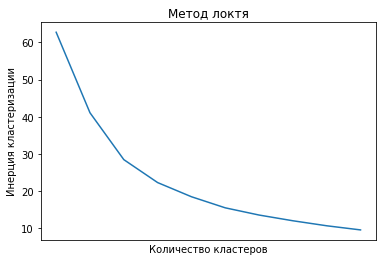

In [951]:
# Метод локтя
n_inertia = []

for i in range(1, 11):
    km = KMeans(n_clusters=i).fit(X)
    n_inertia.append(km.inertia_)
    
fig, ax = plt.subplots()
sns.lineplot(x=np.arange(1, 11), y=n_inertia, ax=ax)
ax.set_title('Метод локтя')
ax.set_xlabel('Количество кластеров')
ax.set_ylabel('Инерция кластеризации')
plt.xticks(np.arange(1, 1))
plt.show()
# ax.set_title('Метод локтя')
# ax.set_xlabel('Количество кластеров')
# ax.set_ylabel('Качество кластеризации')

In [952]:
# Вывод сведений о названиях столбцов датасета df, метод columns
df.columns

Index(['МатрНап', 'Плотн', 'МодУпр', 'КолвОтвер', 'КолвЭпокс', 'ТемпВсп',
       'ПовПлотн', 'МодУпрРаст', 'ПрочнРаст', 'КолвСмол', 'УголНаш', 'ШагНаш',
       'ПлотнНаш', 'ДелРаст', 'Дел'],
      dtype='object')

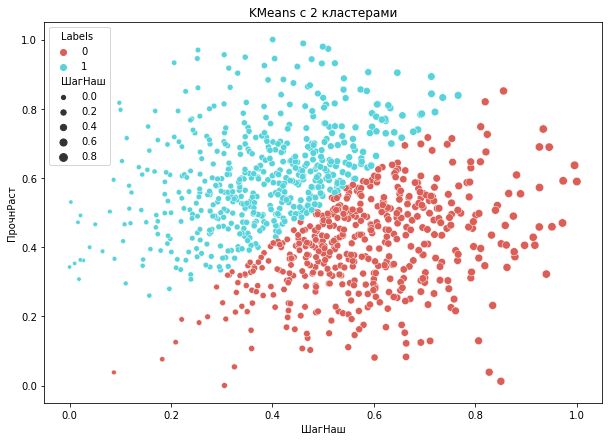

In [953]:
# KMeans показывает кластеризацию параметров
fig = plt.figure(figsize=(10,7))
km5 = KMeans(n_clusters=2).fit(X)
X['Labels'] = km5.labels_

sns.scatterplot(x=X['ШагНаш'], y=X['ПрочнРаст'], hue=X['Labels'], size=X['ШагНаш'], palette=sns.color_palette('hls', 2))

plt.title('KMeans c 2 кластерами')
plt.show()

In [954]:
# количество данных в кластерах
X[X['Labels']==0].count(),X[X['Labels']==1].count(),X[X['Labels']==2].count(),X[X['Labels']==3].count(),X[X['Labels']==4].count()

(ПрочнРаст    496
 ШагНаш       496
 Labels       496
 dtype: int64,
 ПрочнРаст    527
 ШагНаш       527
 Labels       527
 dtype: int64,
 ПрочнРаст    0
 ШагНаш       0
 Labels       0
 dtype: int64,
 ПрочнРаст    0
 ШагНаш       0
 Labels       0
 dtype: int64,
 ПрочнРаст    0
 ШагНаш       0
 Labels       0
 dtype: int64)

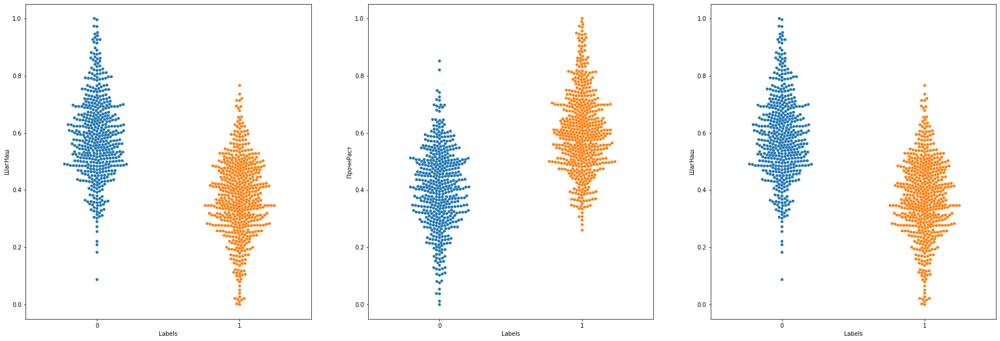

In [955]:
# swarmplot показывает распределение и разброс параметров по кластерам
fig = plt.figure(figsize=(30,10))
ax = fig.add_subplot(131)
sns.swarmplot(x='Labels', y='ШагНаш', data=X, ax=ax)

ax = fig.add_subplot(132)
sns.swarmplot(x='Labels', y='ПрочнРаст', data=X, ax=ax)

ax = fig.add_subplot(133)
sns.swarmplot(x='Labels', y='ШагНаш', data=X, ax=ax)

plt.show()

In [956]:
# The Silhouette Coefficient is calculated using the mean intra-cluster distance and the mean nearest-cluster distance for each sample
print("Silhouette score: {}".format(silhouette_score(X.drop(['Labels'], axis=1), X.Labels)))

Silhouette score: 0.32205871061895436


###### Иерархическая кластеризация (агломеративная)

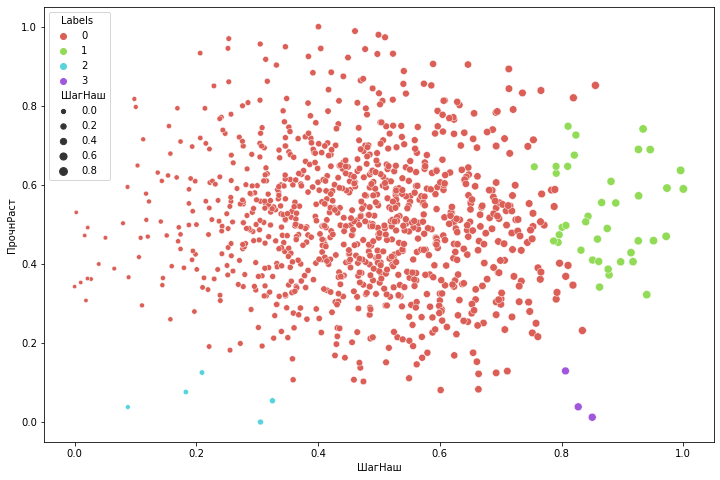

In [957]:
# AgglomerativeClustering показывает агломеративную кластеризацию
agglom = AgglomerativeClustering(n_clusters=4, linkage='average').fit(X.drop(['Labels'], axis=1)) # ward, complete...

X['Labels'] = agglom.labels_
plt.figure(figsize=(12, 8))
sns.scatterplot(x=X['ШагНаш'], y=X['ПрочнРаст'], hue=X['Labels'], size=X['ШагНаш'],
                palette=sns.color_palette('hls', 4))
plt.show()

In [958]:
# количество данных в кластерах
X[X['Labels']==0].count(),X[X['Labels']==1].count(),X[X['Labels']==2].count(),X[X['Labels']==3].count(),X[X['Labels']==4].count()

(ПрочнРаст    976
 ШагНаш       976
 Labels       976
 dtype: int64,
 ПрочнРаст    39
 ШагНаш       39
 Labels       39
 dtype: int64,
 ПрочнРаст    5
 ШагНаш       5
 Labels       5
 dtype: int64,
 ПрочнРаст    3
 ШагНаш       3
 Labels       3
 dtype: int64,
 ПрочнРаст    0
 ШагНаш       0
 Labels       0
 dtype: int64)

In [959]:
# The Silhouette Coefficient is calculated using the mean intra-cluster distance and the mean nearest-cluster distance for each sample
print("Silhouette score: {}".format(silhouette_score(X.drop(['Labels'], axis=1), X.Labels)))

Silhouette score: 0.22709145334722247


In [960]:
# The matrix nearest-cluster distance
dist = distance_matrix(X.drop(['Labels'], axis=1), X.drop(['Labels'], axis=1))
print(dist)

[[0.         0.         0.         ... 0.1204131  0.3669726  0.15276304]
 [0.         0.         0.         ... 0.1204131  0.3669726  0.15276304]
 [0.         0.         0.         ... 0.1204131  0.3669726  0.15276304]
 ...
 [0.1204131  0.1204131  0.1204131  ... 0.         0.25772621 0.14956422]
 [0.3669726  0.3669726  0.3669726  ... 0.25772621 0.         0.27953609]
 [0.15276304 0.15276304 0.15276304 ... 0.14956422 0.27953609 0.        ]]


In [961]:
hierarchy_clustering = hierarchy.linkage(dist, 'complete')

C:\Users\Admin\AppData\Local\Temp\ipykernel_7164\1577177698.py:1: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  hierarchy_clustering = hierarchy.linkage(dist, 'complete')


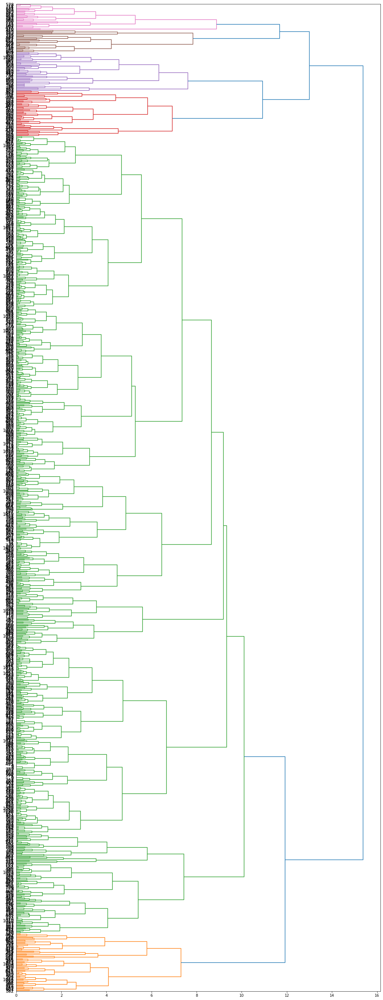

In [962]:
# dendrogram
plt.figure(figsize=(18, 50))
dendro = hierarchy.dendrogram(hierarchy_clustering, leaf_font_size=12, orientation='right')

###### 12. Исключить из параметров 'МатрНап', 'Плотн', 'МодУпр', 'КолвОтвер', 'КолвЭпокс', 'ТемпВсп', 'ПовПлотн', 'МодУпрРаст', 'КолвСмол', 'ШагНаш', 'ДелРаст', 'Дел'

In [963]:
# Вывод сведений о названиях столбцов датасета df, метод columns
df.columns

Index(['МатрНап', 'Плотн', 'МодУпр', 'КолвОтвер', 'КолвЭпокс', 'ТемпВсп',
       'ПовПлотн', 'МодУпрРаст', 'ПрочнРаст', 'КолвСмол', 'УголНаш', 'ШагНаш',
       'ПлотнНаш', 'ДелРаст', 'Дел'],
      dtype='object')

In [964]:
# Назначение переменной X
X = df.drop(['МатрНап', 'Плотн', 'МодУпр', 'КолвОтвер', 'КолвЭпокс', 'ТемпВсп', 'ПовПлотн', 'МодУпрРаст', 'КолвСмол', 'ШагНаш', 'ДелРаст', 'Дел'], axis=1)

###### K-Means

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=4.
  warnings.warn(


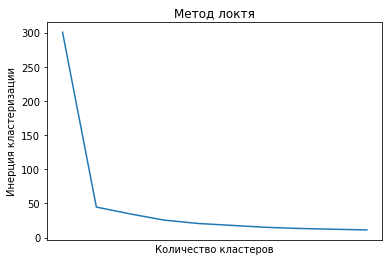

In [965]:
# Метод локтя
n_inertia = []

for i in range(1, 11):
    km = KMeans(n_clusters=i).fit(X)
    n_inertia.append(km.inertia_)
    
fig, ax = plt.subplots()
sns.lineplot(x=np.arange(1, 11), y=n_inertia, ax=ax)
ax.set_title('Метод локтя')
ax.set_xlabel('Количество кластеров')
ax.set_ylabel('Инерция кластеризации')
plt.xticks(np.arange(1, 1))
plt.show()
# ax.set_title('Метод локтя')
# ax.set_xlabel('Количество кластеров')
# ax.set_ylabel('Качество кластеризации')

In [966]:
# Вывод сведений о названиях столбцов датасета df, метод columns
df.columns

Index(['МатрНап', 'Плотн', 'МодУпр', 'КолвОтвер', 'КолвЭпокс', 'ТемпВсп',
       'ПовПлотн', 'МодУпрРаст', 'ПрочнРаст', 'КолвСмол', 'УголНаш', 'ШагНаш',
       'ПлотнНаш', 'ДелРаст', 'Дел'],
      dtype='object')

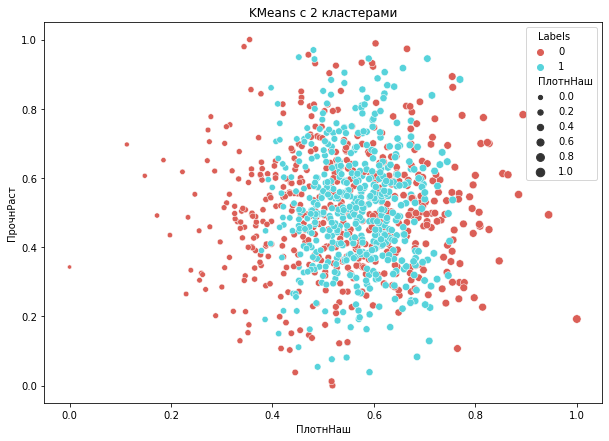

In [967]:
# KMeans показывает кластеризацию параметров
fig = plt.figure(figsize=(10,7))
km5 = KMeans(n_clusters=2).fit(X)
X['Labels'] = km5.labels_

sns.scatterplot(x=X['ПлотнНаш'], y=X['ПрочнРаст'], hue=X['Labels'], size=X['ПлотнНаш'], palette=sns.color_palette('hls', 2))

plt.title('KMeans c 2 кластерами')
plt.show()

In [968]:
# количество данных в кластерах
X[X['Labels']==0].count(),X[X['Labels']==1].count(),X[X['Labels']==2].count(),X[X['Labels']==3].count(),X[X['Labels']==4].count()

(ПрочнРаст    520
 УголНаш      520
 ПлотнНаш     520
 Labels       520
 dtype: int64,
 ПрочнРаст    503
 УголНаш      503
 ПлотнНаш     503
 Labels       503
 dtype: int64,
 ПрочнРаст    0
 УголНаш      0
 ПлотнНаш     0
 Labels       0
 dtype: int64,
 ПрочнРаст    0
 УголНаш      0
 ПлотнНаш     0
 Labels       0
 dtype: int64,
 ПрочнРаст    0
 УголНаш      0
 ПлотнНаш     0
 Labels       0
 dtype: int64)

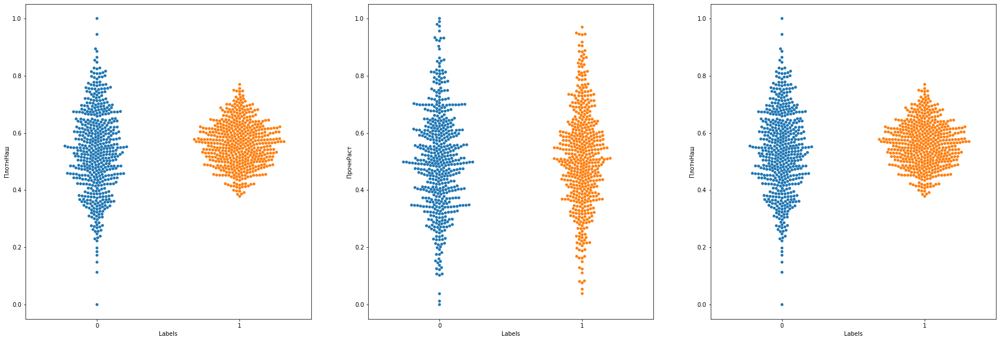

In [969]:
# swarmplot показывает распределение и разброс параметров по кластерам
fig = plt.figure(figsize=(30,10))
ax = fig.add_subplot(131)
sns.swarmplot(x='Labels', y='ПлотнНаш', data=X, ax=ax)

ax = fig.add_subplot(132)
sns.swarmplot(x='Labels', y='ПрочнРаст', data=X, ax=ax)

ax = fig.add_subplot(133)
sns.swarmplot(x='Labels', y='ПлотнНаш', data=X, ax=ax)

plt.show()

In [970]:
# The Silhouette Coefficient is calculated using the mean intra-cluster distance and the mean nearest-cluster distance for each sample
print("Silhouette score: {}".format(silhouette_score(X.drop(['Labels'], axis=1), X.Labels)))

Silhouette score: 0.7544065558680658


###### Иерархическая кластеризация (агломеративная)

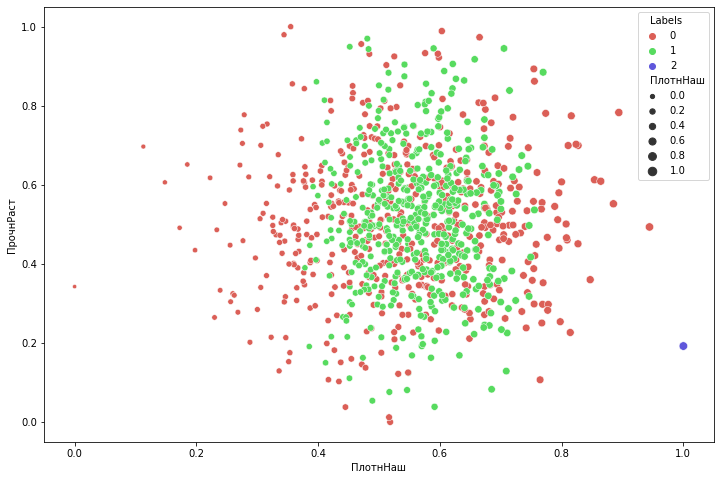

In [971]:
# AgglomerativeClustering показывает агломеративную кластеризацию
agglom = AgglomerativeClustering(n_clusters=3, linkage='average').fit(X.drop(['Labels'], axis=1)) # ward, complete...

X['Labels'] = agglom.labels_
plt.figure(figsize=(12, 8))
sns.scatterplot(x=X['ПлотнНаш'], y=X['ПрочнРаст'], hue=X['Labels'], size=X['ПлотнНаш'],
                palette=sns.color_palette('hls', 3))
plt.show()

In [972]:
# количество данных в кластерах
X[X['Labels']==0].count(),X[X['Labels']==1].count(),X[X['Labels']==2].count(),X[X['Labels']==3].count(),X[X['Labels']==4].count()

(ПрочнРаст    519
 УголНаш      519
 ПлотнНаш     519
 Labels       519
 dtype: int64,
 ПрочнРаст    503
 УголНаш      503
 ПлотнНаш     503
 Labels       503
 dtype: int64,
 ПрочнРаст    1
 УголНаш      1
 ПлотнНаш     1
 Labels       1
 dtype: int64,
 ПрочнРаст    0
 УголНаш      0
 ПлотнНаш     0
 Labels       0
 dtype: int64,
 ПрочнРаст    0
 УголНаш      0
 ПлотнНаш     0
 Labels       0
 dtype: int64)

In [973]:
# The Silhouette Coefficient is calculated using the mean intra-cluster distance and the mean nearest-cluster distance for each sample
print("Silhouette score: {}".format(silhouette_score(X.drop(['Labels'], axis=1), X.Labels)))

Silhouette score: 0.6284050824472965


In [974]:
# The matrix nearest-cluster distance
dist = distance_matrix(X.drop(['Labels'], axis=1), X.drop(['Labels'], axis=1))
print(dist)

[[0.         0.02884923 0.12501334 ... 1.01233571 1.05316462 1.02040477]
 [0.02884923 0.         0.09616411 ... 1.00983066 1.05322755 1.01524384]
 [0.12501334 0.09616411 0.         ... 1.00741964 1.05912793 1.00385378]
 ...
 [1.01233571 1.00983066 1.00741964 ... 0.         0.22875751 0.11671662]
 [1.05316462 1.05322755 1.05912793 ... 0.22875751 0.         0.33447402]
 [1.02040477 1.01524384 1.00385378 ... 0.11671662 0.33447402 0.        ]]


In [975]:
hierarchy_clustering = hierarchy.linkage(dist, 'complete')

C:\Users\Admin\AppData\Local\Temp\ipykernel_7164\1577177698.py:1: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  hierarchy_clustering = hierarchy.linkage(dist, 'complete')


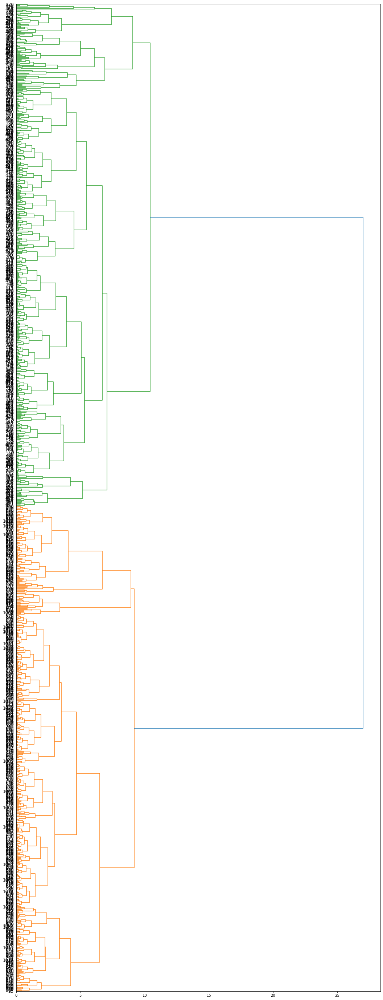

In [976]:
# dendrogram
plt.figure(figsize=(18, 50))
dendro = hierarchy.dendrogram(hierarchy_clustering, leaf_font_size=12, orientation='right')

###### 13. Исключить из параметров 'МатрНап', 'Плотн', 'МодУпр', 'КолвОтвер', 'КолвЭпокс', 'ТемпВсп', 'ПовПлотн', 'МодУпрРаст', 'КолвСмол', 'УголНаш', 'ШагНаш', 'ПлотнНаш', 'Дел'

In [977]:
# Вывод сведений о названиях столбцов датасета df, метод columns
df.columns

Index(['МатрНап', 'Плотн', 'МодУпр', 'КолвОтвер', 'КолвЭпокс', 'ТемпВсп',
       'ПовПлотн', 'МодУпрРаст', 'ПрочнРаст', 'КолвСмол', 'УголНаш', 'ШагНаш',
       'ПлотнНаш', 'ДелРаст', 'Дел'],
      dtype='object')

In [978]:
# Назначение переменной X
X = df.drop(['МатрНап', 'Плотн', 'МодУпр', 'КолвОтвер', 'КолвЭпокс', 'ТемпВсп', 'ПовПлотн', 'МодУпрРаст', 'КолвСмол', 'УголНаш', 'ШагНаш', 'ПлотнНаш', 'Дел'], axis=1)

###### K-Means

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=4.
  warnings.warn(


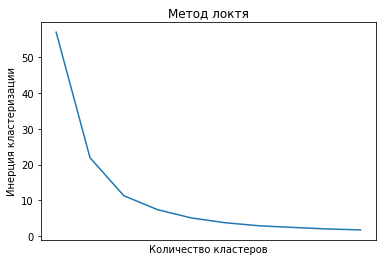

In [979]:
# Метод локтя
n_inertia = []

for i in range(1, 11):
    km = KMeans(n_clusters=i).fit(X)
    n_inertia.append(km.inertia_)
    
fig, ax = plt.subplots()
sns.lineplot(x=np.arange(1, 11), y=n_inertia, ax=ax)
ax.set_title('Метод локтя')
ax.set_xlabel('Количество кластеров')
ax.set_ylabel('Инерция кластеризации')
plt.xticks(np.arange(1, 1))
plt.show()
# ax.set_title('Метод локтя')
# ax.set_xlabel('Количество кластеров')
# ax.set_ylabel('Качество кластеризации')

In [980]:
# Вывод сведений о названиях столбцов датасета df, метод columns
df.columns

Index(['МатрНап', 'Плотн', 'МодУпр', 'КолвОтвер', 'КолвЭпокс', 'ТемпВсп',
       'ПовПлотн', 'МодУпрРаст', 'ПрочнРаст', 'КолвСмол', 'УголНаш', 'ШагНаш',
       'ПлотнНаш', 'ДелРаст', 'Дел'],
      dtype='object')

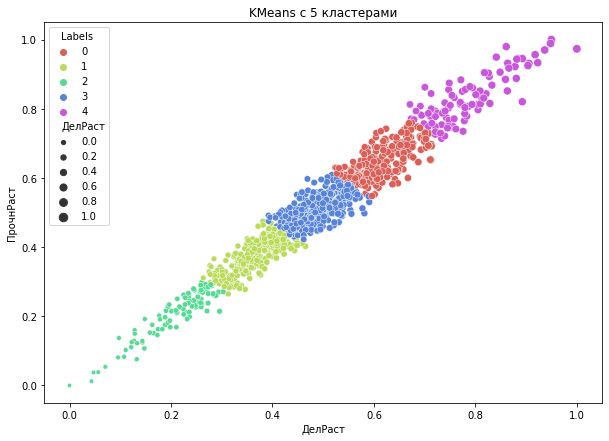

In [981]:
# KMeans показывает кластеризацию параметров
fig = plt.figure(figsize=(10,7))
km5 = KMeans(n_clusters=5).fit(X)
X['Labels'] = km5.labels_

sns.scatterplot(x=X['ДелРаст'], y=X['ПрочнРаст'], hue=X['Labels'], size=X['ДелРаст'], palette=sns.color_palette('hls', 5))

plt.title('KMeans c 5 кластерами')
plt.show()

In [982]:
# количество данных в кластерах
X[X['Labels']==0].count(),X[X['Labels']==1].count(),X[X['Labels']==2].count(),X[X['Labels']==3].count(),X[X['Labels']==4].count()

(ПрочнРаст    241
 ДелРаст      241
 Labels       241
 dtype: int64,
 ПрочнРаст    262
 ДелРаст      262
 Labels       262
 dtype: int64,
 ПрочнРаст    95
 ДелРаст      95
 Labels       95
 dtype: int64,
 ПрочнРаст    332
 ДелРаст      332
 Labels       332
 dtype: int64,
 ПрочнРаст    93
 ДелРаст      93
 Labels       93
 dtype: int64)

In [983]:
# данные в кластерах по параметру 'ПрочнРаст'
X[X['Labels']==0]['ПрочнРаст'].head(20),X[X['Labels']==1]['ПрочнРаст'].head(20),X[X['Labels']==2]['ПрочнРаст'].head(20),X[X['Labels']==3]['ПрочнРаст'].head(20),X[X['Labels']==4]['ПрочнРаст'].head(20)

(0     0.698235
 1     0.698235
 2     0.698235
 3     0.698235
 4     0.698235
 5     0.698235
 6     0.698235
 15    0.698235
 16    0.698235
 27    0.719231
 29    0.593114
 31    0.625957
 34    0.729017
 38    0.605842
 40    0.644347
 41    0.651495
 56    0.594412
 58    0.598115
 62    0.648537
 64    0.699905
 Name: ПрочнРаст, dtype: float64,
 9     0.342563
 10    0.342563
 11    0.342563
 19    0.342563
 20    0.342563
 28    0.445341
 33    0.450606
 36    0.303619
 42    0.421020
 50    0.348433
 51    0.377301
 59    0.343290
 60    0.394141
 66    0.428445
 69    0.401032
 72    0.319201
 74    0.264540
 79    0.296319
 80    0.344317
 82    0.346239
 Name: ПрочнРаст, dtype: float64,
 7      0.271429
 8      0.271429
 17     0.271429
 18     0.271429
 37     0.124386
 45     0.214490
 49     0.269906
 65     0.209087
 70     0.106904
 77     0.129287
 84     0.201768
 94     0.151016
 113    0.175257
 119    0.238088
 136    0.288433
 153    0.259803
 154    0.159781
 15

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\categorical.py:1296: UserWarning: 14.5% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\categorical.py:1296: UserWarning: 16.8% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\categorical.py:1296: UserWarning: 34.3% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\categorical.py:1296: UserWarning: 15.4% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\categorical.py:1296: UserWarning: 16.8% of the points

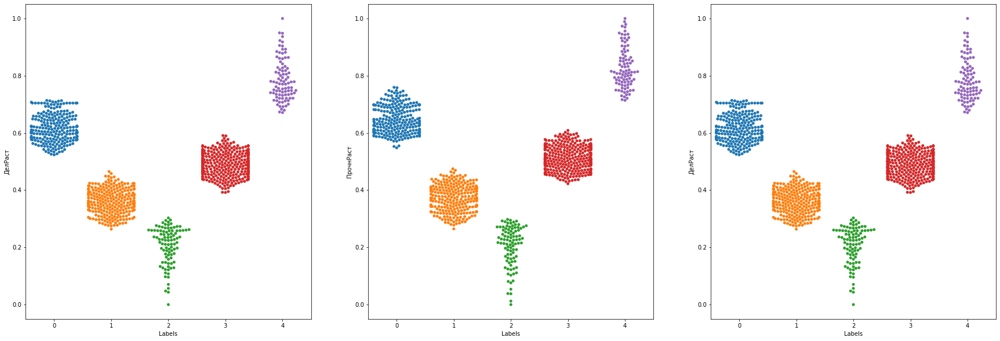

In [984]:
# swarmplot показывает распределение и разброс параметров по кластерам
fig = plt.figure(figsize=(30,10))
ax = fig.add_subplot(131)
sns.swarmplot(x='Labels', y='ДелРаст', data=X, ax=ax)

ax = fig.add_subplot(132)
sns.swarmplot(x='Labels', y='ПрочнРаст', data=X, ax=ax)

ax = fig.add_subplot(133)
sns.swarmplot(x='Labels', y='ДелРаст', data=X, ax=ax)

plt.show()

In [985]:
# The Silhouette Coefficient is calculated using the mean intra-cluster distance and the mean nearest-cluster distance for each sample
print("Silhouette score: {}".format(silhouette_score(X.drop(['Labels'], axis=1), X.Labels)))

Silhouette score: 0.47399655012575553


###### Иерархическая кластеризация (агломеративная)

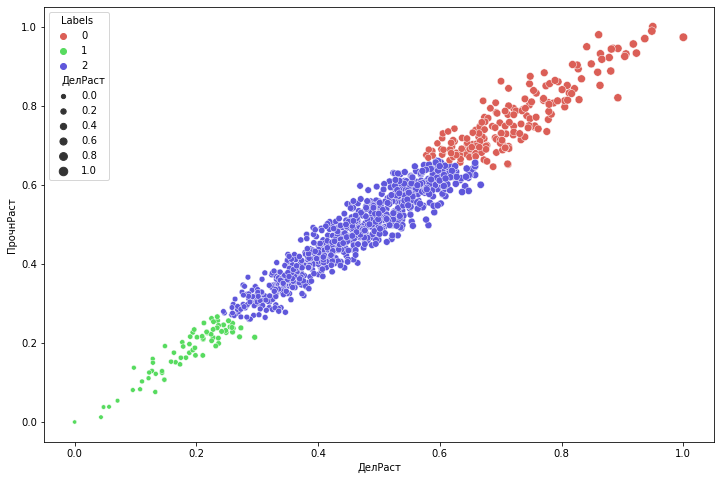

In [986]:
# AgglomerativeClustering показывает агломеративную кластеризацию
agglom = AgglomerativeClustering(n_clusters=3, linkage='average').fit(X.drop(['Labels'], axis=1)) # ward, complete...

X['Labels'] = agglom.labels_
plt.figure(figsize=(12, 8))
sns.scatterplot(x=X['ДелРаст'], y=X['ПрочнРаст'], hue=X['Labels'], size=X['ДелРаст'],
                palette=sns.color_palette('hls', 3))
plt.show()

In [987]:
# количество данных в кластерах
X[X['Labels']==0].count(),X[X['Labels']==1].count(),X[X['Labels']==2].count(),X[X['Labels']==3].count(),X[X['Labels']==4].count()

(ПрочнРаст    188
 ДелРаст      188
 Labels       188
 dtype: int64,
 ПрочнРаст    71
 ДелРаст      71
 Labels       71
 dtype: int64,
 ПрочнРаст    764
 ДелРаст      764
 Labels       764
 dtype: int64,
 ПрочнРаст    0
 ДелРаст      0
 Labels       0
 dtype: int64,
 ПрочнРаст    0
 ДелРаст      0
 Labels       0
 dtype: int64)

In [988]:
# The Silhouette Coefficient is calculated using the mean intra-cluster distance and the mean nearest-cluster distance for each sample
print("Silhouette score: {}".format(silhouette_score(X.drop(['Labels'], axis=1), X.Labels)))

Silhouette score: 0.41198385885966476


In [989]:
# The matrix nearest-cluster distance
dist = distance_matrix(X.drop(['Labels'], axis=1), X.drop(['Labels'], axis=1))
print(dist)

[[0.         0.         0.         ... 0.20884566 0.48267472 0.11639773]
 [0.         0.         0.         ... 0.20884566 0.48267472 0.11639773]
 [0.         0.         0.         ... 0.20884566 0.48267472 0.11639773]
 ...
 [0.20884566 0.20884566 0.20884566 ... 0.         0.27749881 0.09562685]
 [0.48267472 0.48267472 0.48267472 ... 0.27749881 0.         0.37301064]
 [0.11639773 0.11639773 0.11639773 ... 0.09562685 0.37301064 0.        ]]


In [990]:
hierarchy_clustering = hierarchy.linkage(dist, 'complete')

C:\Users\Admin\AppData\Local\Temp\ipykernel_7164\1577177698.py:1: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  hierarchy_clustering = hierarchy.linkage(dist, 'complete')


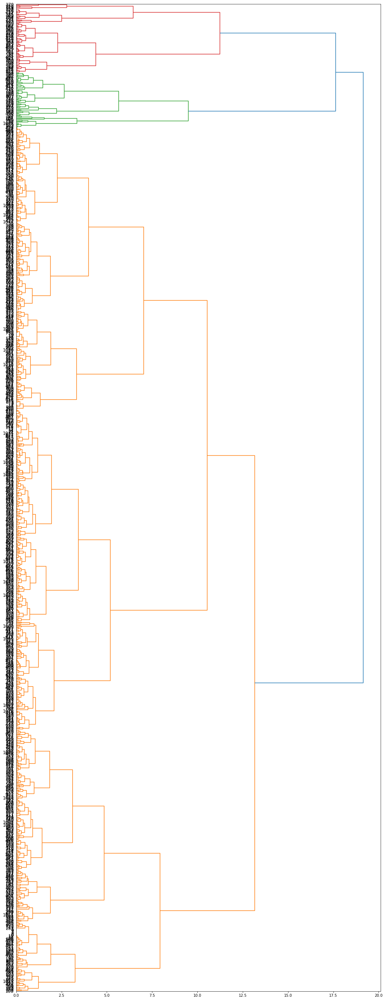

In [991]:
# dendrogram
plt.figure(figsize=(18, 50))
dendro = hierarchy.dendrogram(hierarchy_clustering, leaf_font_size=12, orientation='right')

### DBSCAN

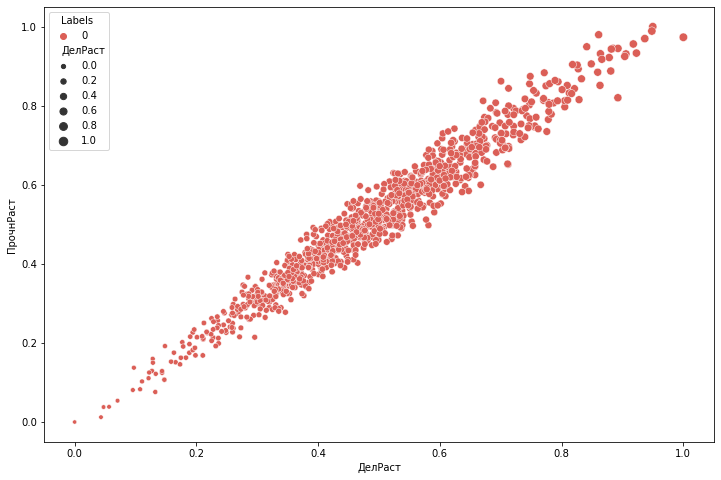

In [992]:
# кластеризация DBSCAN
from sklearn.cluster import DBSCAN 

db = DBSCAN(eps=10, min_samples=2).fit(X.drop(['Labels'], axis=1))

X['Labels'] = db.labels_
plt.figure(figsize=(12, 8))
sns.scatterplot(x=X['ДелРаст'], y=X['ПрочнРаст'], hue=X['Labels'], size=X['ДелРаст'],
                palette=sns.color_palette('hls', np.unique(db.labels_).shape[0]))
plt.show()

In [993]:
# The Silhouette Coefficient is calculated using the mean intra-cluster distance and the mean nearest-cluster distance for each sample
#print("Silhouette score: {}".format(silhouette_score(X.drop(['Labels'], axis=1), X.Labels)))

### C-means

In [994]:
# C-mean подобно KMeans показывает кластеризацию параметров
X.drop(['Labels'], axis=1, inplace=True)
fcm = FCM(n_clusters=3)
fcm.fit(X.values)

fcm_centers = fcm.centers
fcm_labels = fcm.predict(X.values) 

In [995]:
X['Labels'] = fcm_labels

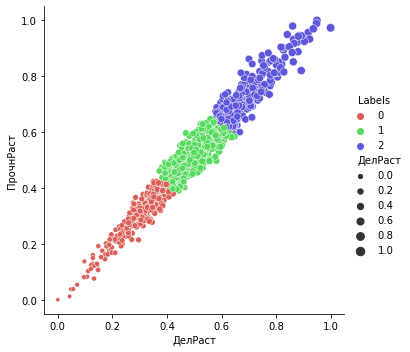

In [996]:
sns.relplot(x='ДелРаст', y='ПрочнРаст', hue='Labels', 
            size='ДелРаст', data=X, palette = sns.color_palette('hls', 3))

In [997]:
# количество данных в кластерах
X[X['Labels']==0].count(),X[X['Labels']==1].count(),X[X['Labels']==2].count(),X[X['Labels']==3].count()

(ПрочнРаст    300
 ДелРаст      300
 Labels       300
 dtype: int64,
 ПрочнРаст    486
 ДелРаст      486
 Labels       486
 dtype: int64,
 ПрочнРаст    237
 ДелРаст      237
 Labels       237
 dtype: int64,
 ПрочнРаст    0
 ДелРаст      0
 Labels       0
 dtype: int64)

In [998]:
# данные в кластерах по 'ПрочнРаст'
X[X['Labels']==0]['ПрочнРаст'],X[X['Labels']==1]['ПрочнРаст'],X[X['Labels']==2]['ПрочнРаст'],X[X['Labels']==3]['ПрочнРаст']

(7       0.271429
 8       0.271429
 9       0.342563
 10      0.342563
 11      0.342563
           ...   
 1003    0.371232
 1010    0.317909
 1012    0.378053
 1013    0.320976
 1021    0.368070
 Name: ПрочнРаст, Length: 300, dtype: float64,
 12      0.504591
 13      0.504591
 14      0.504591
 21      0.504591
 22      0.504591
           ...   
 1015    0.500297
 1016    0.508635
 1018    0.480312
 1019    0.470745
 1020    0.578340
 Name: ПрочнРаст, Length: 486, dtype: float64,
 0       0.698235
 1       0.698235
 2       0.698235
 3       0.698235
 4       0.698235
           ...   
 997     0.883448
 1008    0.943372
 1011    0.695045
 1017    0.734705
 1022    0.647135
 Name: ПрочнРаст, Length: 237, dtype: float64,
 Series([], Name: ПрочнРаст, dtype: float64))

In [999]:
# The Silhouette Coefficient is calculated using the mean intra-cluster distance and the mean nearest-cluster distance for each sample
print("Silhouette score: {}".format(silhouette_score(X.drop(['Labels'], axis=1), X.Labels)))

Silhouette score: 0.5108778863387679


###### 14. Исключить из параметров 'МатрНап', 'Плотн', 'МодУпр', 'КолвОтвер', 'КолвЭпокс', 'ТемпВсп', 'ПовПлотн', 'МодУпрРаст', 'КолвСмол', 'УголНаш', 'ШагНаш', 'ПлотнНаш', 'ДелРаст'

In [1000]:
# Вывод сведений о названиях столбцов датасета df, метод columns
df.columns

Index(['МатрНап', 'Плотн', 'МодУпр', 'КолвОтвер', 'КолвЭпокс', 'ТемпВсп',
       'ПовПлотн', 'МодУпрРаст', 'ПрочнРаст', 'КолвСмол', 'УголНаш', 'ШагНаш',
       'ПлотнНаш', 'ДелРаст', 'Дел'],
      dtype='object')

In [1001]:
# Назначение переменной X
X = df.drop(['МатрНап', 'Плотн', 'МодУпр', 'КолвОтвер', 'КолвЭпокс', 'ТемпВсп', 'ПовПлотн', 'МодУпрРаст', 'КолвСмол', 'УголНаш', 'ШагНаш', 'ПлотнНаш', 'ДелРаст'], axis=1)

###### K-Means

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=4.
  warnings.warn(


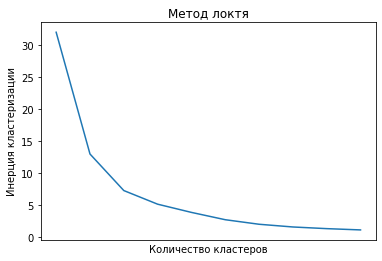

In [1002]:
# Метод локтя
n_inertia = []

for i in range(1, 11):
    km = KMeans(n_clusters=i).fit(X)
    n_inertia.append(km.inertia_)
    
fig, ax = plt.subplots()
sns.lineplot(x=np.arange(1, 11), y=n_inertia, ax=ax)
ax.set_title('Метод локтя')
ax.set_xlabel('Количество кластеров')
ax.set_ylabel('Инерция кластеризации')
plt.xticks(np.arange(1, 1))
plt.show()
# ax.set_title('Метод локтя')
# ax.set_xlabel('Количество кластеров')
# ax.set_ylabel('Качество кластеризации')

In [1003]:
# Вывод сведений о названиях столбцов датасета df, метод columns
df.columns

Index(['МатрНап', 'Плотн', 'МодУпр', 'КолвОтвер', 'КолвЭпокс', 'ТемпВсп',
       'ПовПлотн', 'МодУпрРаст', 'ПрочнРаст', 'КолвСмол', 'УголНаш', 'ШагНаш',
       'ПлотнНаш', 'ДелРаст', 'Дел'],
      dtype='object')

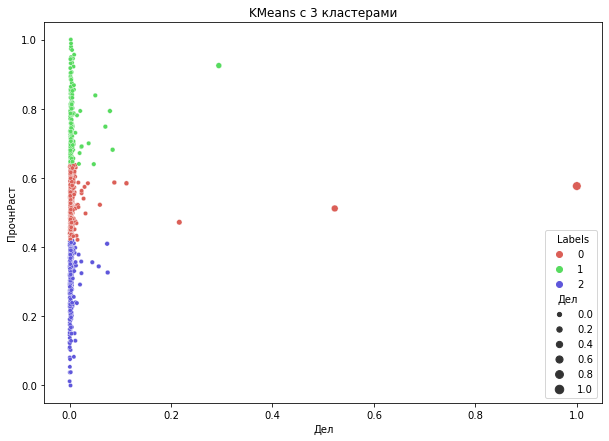

In [1004]:
# KMeans показывает кластеризацию параметров
fig = plt.figure(figsize=(10,7))
km5 = KMeans(n_clusters=3).fit(X)
X['Labels'] = km5.labels_

sns.scatterplot(x=X['Дел'], y=X['ПрочнРаст'], hue=X['Labels'], size=X['Дел'], palette=sns.color_palette('hls', 3))

plt.title('KMeans c 3 кластерами')
plt.show()

In [1005]:
# количество данных в кластерах
X[X['Labels']==0].count(),X[X['Labels']==1].count(),X[X['Labels']==2].count(),X[X['Labels']==3].count(),X[X['Labels']==4].count()

(ПрочнРаст    494
 Дел          494
 Labels       494
 dtype: int64,
 ПрочнРаст    216
 Дел          216
 Labels       216
 dtype: int64,
 ПрочнРаст    313
 Дел          313
 Labels       313
 dtype: int64,
 ПрочнРаст    0
 Дел          0
 Labels       0
 dtype: int64,
 ПрочнРаст    0
 Дел          0
 Labels       0
 dtype: int64)

In [1006]:
# данные в кластерах по параметру 'ПрочнРаст'
X[X['Labels']==0]['ПрочнРаст'].head(20),X[X['Labels']==1]['ПрочнРаст'].head(20),X[X['Labels']==2]['ПрочнРаст'].head(20)

(12    0.504591
 13    0.504591
 14    0.504591
 21    0.504591
 22    0.504591
 23    0.551464
 25    0.564512
 26    0.510862
 28    0.445341
 29    0.593114
 30    0.502239
 31    0.625957
 32    0.507099
 33    0.450606
 38    0.605842
 39    0.541612
 42    0.421020
 43    0.461906
 44    0.436028
 47    0.529936
 Name: ПрочнРаст, dtype: float64,
 0     0.698235
 1     0.698235
 2     0.698235
 3     0.698235
 4     0.698235
 5     0.698235
 6     0.698235
 15    0.698235
 16    0.698235
 24    0.949223
 27    0.719231
 34    0.729017
 35    0.765150
 40    0.644347
 41    0.651495
 46    0.843247
 57    0.753826
 62    0.648537
 64    0.699905
 67    0.683267
 Name: ПрочнРаст, dtype: float64,
 7     0.271429
 8     0.271429
 9     0.342563
 10    0.342563
 11    0.342563
 17    0.271429
 18    0.271429
 19    0.342563
 20    0.342563
 36    0.303619
 37    0.124386
 45    0.214490
 49    0.269906
 50    0.348433
 51    0.377301
 59    0.343290
 60    0.394141
 65    0.209087
 69 

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\categorical.py:1296: UserWarning: 89.3% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\categorical.py:1296: UserWarning: 81.9% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\categorical.py:1296: UserWarning: 86.6% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\categorical.py:1296: UserWarning: 7.9% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\categorical.py:1296: UserWarning: 89.3% of the points 

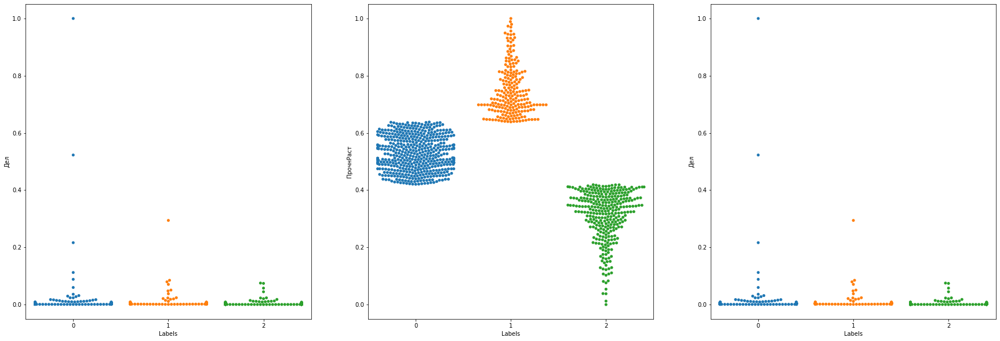

In [1007]:
# swarmplot показывает распределение и разброс параметров по кластерам
fig = plt.figure(figsize=(30,10))
ax = fig.add_subplot(131)
sns.swarmplot(x='Labels', y='Дел', data=X, ax=ax)

ax = fig.add_subplot(132)
sns.swarmplot(x='Labels', y='ПрочнРаст', data=X, ax=ax)

ax = fig.add_subplot(133)
sns.swarmplot(x='Labels', y='Дел', data=X, ax=ax)

plt.show()

In [1008]:
# The Silhouette Coefficient is calculated using the mean intra-cluster distance and the mean nearest-cluster distance for each sample
print("Silhouette score: {}".format(silhouette_score(X.drop(['Labels'], axis=1), X.Labels)))

Silhouette score: 0.5288580813007286


###### Иерархическая кластеризация (агломеративная)

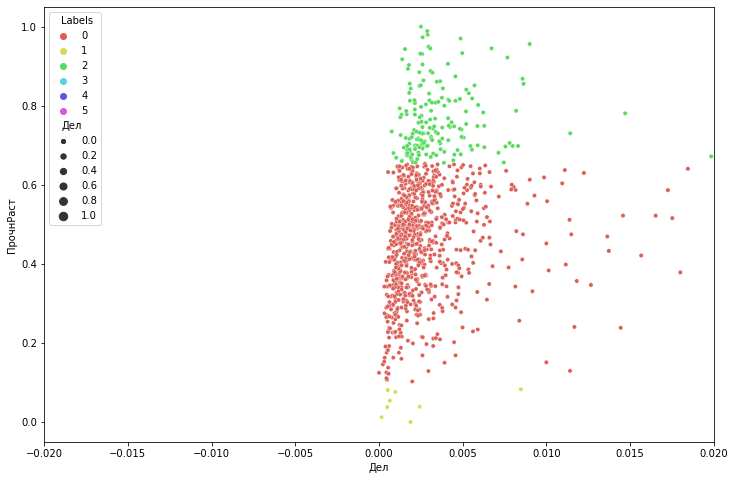

In [1009]:
# AgglomerativeClustering показывает агломеративную кластеризацию
agglom = AgglomerativeClustering(n_clusters=6, linkage='average').fit(X.drop(['Labels'], axis=1)) # ward, complete...

X['Labels'] = agglom.labels_
plt.figure(figsize=(12, 8))
sns.scatterplot(x=X['Дел'], y=X['ПрочнРаст'], hue=X['Labels'], size=X['Дел'],
                palette=sns.color_palette('hls', 6))
plt.xlim(xmin=-0.02, xmax=0.02)
plt.show()

In [1010]:
# количество данных в кластерах
X[X['Labels']==0].count(),X[X['Labels']==1].count(),X[X['Labels']==2].count(),X[X['Labels']==3].count(),X[X['Labels']==4].count(),X[X['Labels']==5].count()

(ПрочнРаст    822
 Дел          822
 Labels       822
 dtype: int64,
 ПрочнРаст    8
 Дел          8
 Labels       8
 dtype: int64,
 ПрочнРаст    190
 Дел          190
 Labels       190
 dtype: int64,
 ПрочнРаст    1
 Дел          1
 Labels       1
 dtype: int64,
 ПрочнРаст    1
 Дел          1
 Labels       1
 dtype: int64,
 ПрочнРаст    1
 Дел          1
 Labels       1
 dtype: int64)

In [1011]:
# данные в кластерах по 'ПрочнРаст'
X[X['Labels']==0]['ПрочнРаст'].head(20),X[X['Labels']==1]['ПрочнРаст'].head(20),X[X['Labels']==2]['ПрочнРаст'].head(20),X[X['Labels']==3]['ПрочнРаст'].head(20),X[X['Labels']==4]['ПрочнРаст'].head(20),X[X['Labels']==5]['ПрочнРаст'].head(20),

(7     0.271429
 8     0.271429
 9     0.342563
 10    0.342563
 11    0.342563
 12    0.504591
 13    0.504591
 14    0.504591
 17    0.271429
 18    0.271429
 19    0.342563
 20    0.342563
 21    0.504591
 22    0.504591
 23    0.551464
 25    0.564512
 26    0.510862
 28    0.445341
 29    0.593114
 30    0.502239
 Name: ПрочнРаст, dtype: float64,
 262    0.000000
 270    0.012188
 318    0.037827
 643    0.082826
 719    0.038487
 734    0.080899
 783    0.075949
 858    0.053867
 Name: ПрочнРаст, dtype: float64,
 0     0.698235
 1     0.698235
 2     0.698235
 3     0.698235
 4     0.698235
 5     0.698235
 6     0.698235
 15    0.698235
 16    0.698235
 24    0.949223
 27    0.719231
 34    0.729017
 35    0.765150
 46    0.843247
 57    0.753826
 64    0.699905
 67    0.683267
 68    0.832440
 71    0.639752
 73    0.745932
 Name: ПрочнРаст, dtype: float64,
 487    0.511737
 Name: ПрочнРаст, dtype: float64,
 520    0.576469
 Name: ПрочнРаст, dtype: float64,
 523    0.92476
 Nam

In [1012]:
# The Silhouette Coefficient is calculated using the mean intra-cluster distance and the mean nearest-cluster distance for each sample
print("Silhouette score: {}".format(silhouette_score(X.drop(['Labels'], axis=1), X.Labels)))

Silhouette score: 0.40755116723637946


In [1013]:
# The matrix nearest-cluster distance
dist = distance_matrix(X.drop(['Labels'], axis=1), X.drop(['Labels'], axis=1))
print(dist)

[[0.         0.         0.         ... 0.11991387 0.33016662 0.05116357]
 [0.         0.         0.         ... 0.11991387 0.33016662 0.05116357]
 [0.         0.         0.         ... 0.11991387 0.33016662 0.05116357]
 ...
 [0.11991387 0.11991387 0.11991387 ... 0.         0.2102956  0.06879636]
 [0.33016662 0.33016662 0.33016662 ... 0.2102956  0.         0.27908956]
 [0.05116357 0.05116357 0.05116357 ... 0.06879636 0.27908956 0.        ]]


In [1014]:
hierarchy_clustering = hierarchy.linkage(dist, 'complete')

C:\Users\Admin\AppData\Local\Temp\ipykernel_7164\1577177698.py:1: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  hierarchy_clustering = hierarchy.linkage(dist, 'complete')


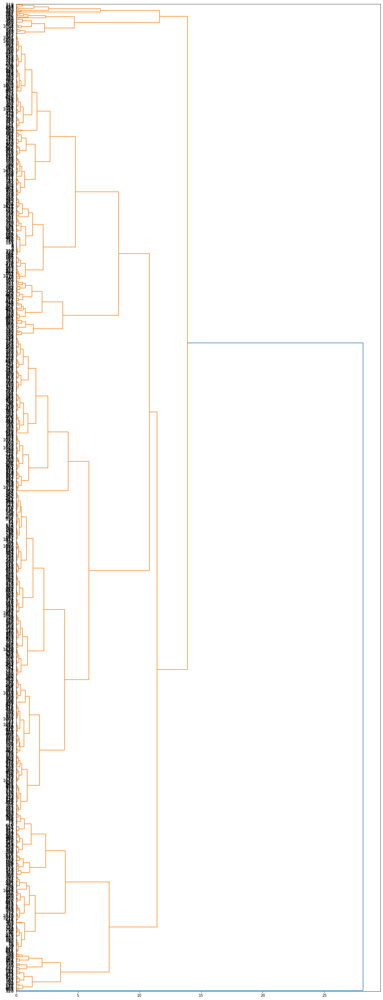

In [1015]:
# dendrogram
plt.figure(figsize=(18, 50))
dendro = hierarchy.dendrogram(hierarchy_clustering, leaf_font_size=12, orientation='right')

### DBSCAN

In [1016]:
# кластеризация DBSCAN
from sklearn.cluster import DBSCAN 

db = DBSCAN(eps=0, min_samples=2).fit(X.drop(['Labels'], axis=1))

X['Labels'] = db.labels_
plt.figure(figsize=(12, 8))
sns.scatterplot(x=X['Дел'], y=X['ПрочнРаст'], hue=X['Labels'], size=X['Дел'],
                palette=sns.color_palette('hls', np.unique(db.labels_).shape[0]))
plt.show()

ValueError: eps must be positive.

In [ ]:
# The Silhouette Coefficient is calculated using the mean intra-cluster distance and the mean nearest-cluster distance for each sample
#print("Silhouette score: {}".format(silhouette_score(X.drop(['Labels'], axis=1), X.Labels)))

### C-means

In [ ]:
# C-mean подобно KMeans показывает кластеризацию параметров
X.drop(['Labels'], axis=1, inplace=True)
fcm = FCM(n_clusters=3)
fcm.fit(X.values)

fcm_centers = fcm.centers
fcm_labels = fcm.predict(X.values) 

In [ ]:
X['Labels'] = fcm_labels

In [ ]:
sns.relplot(x='Дел', y='ПрочнРаст', hue='Labels', 
            size='Дел', data=X, palette = sns.color_palette('hls', 3))

In [ ]:
# количество данных в кластерах
X[X['Labels']==0].count(),X[X['Labels']==1].count(),X[X['Labels']==2].count(),X[X['Labels']==3].count()

In [ ]:
# данные в кластерах по 'ПрочнРаст'
X[X['Labels']==0]['ПрочнРаст'],X[X['Labels']==1]['ПрочнРаст'],X[X['Labels']==2]['ПрочнРаст'],X[X['Labels']==3]['ПрочнРаст']

In [ ]:
# The Silhouette Coefficient is calculated using the mean intra-cluster distance and the mean nearest-cluster distance for each sample
print("Silhouette score: {}".format(silhouette_score(X.drop(['Labels'], axis=1), X.Labels)))

###### 15. Исключить из параметров: ничего

In [ ]:
# Вывод сведений о названиях столбцов датасета df, метод columns
df.columns

In [ ]:
# Назначение переменной X
X = df.drop(['УголНаш','Дел'], axis=1)

###### K-Means

In [ ]:
# Метод локтя
n_inertia = []

for i in range(1, 11):
    km = KMeans(n_clusters=i).fit(X)
    n_inertia.append(km.inertia_)
    
fig, ax = plt.subplots()
sns.lineplot(x=np.arange(1, 11), y=n_inertia, ax=ax)
ax.set_title('Метод локтя')
ax.set_xlabel('Количество кластеров')
ax.set_ylabel('Инерция кластеризации')
plt.xticks(np.arange(1, 1))
plt.show()
# ax.set_title('Метод локтя')
# ax.set_xlabel('Количество кластеров')
# ax.set_ylabel('Качество кластеризации')

In [ ]:
# KMeans показывает кластеризацию параметров
fig = plt.figure(figsize=(10,7))
km5 = KMeans(n_clusters=3).fit(X)
X['Labels'] = km5.labels_

sns.scatterplot(x=X['ДелРаст'], y=X['ПрочнРаст'], hue=X['Labels'], size=X['ДелРаст'], palette=sns.color_palette('hls', 3))

plt.title('KMeans c 3 кластерами')
plt.show()

In [ ]:
# количество данных в кластерах
X[X['Labels']==0].count(),X[X['Labels']==1].count(),X[X['Labels']==2].count(),X[X['Labels']==3].count(),X[X['Labels']==4].count()

In [ ]:
# данные в кластерах по параметру 'ПрочнРаст'
X[X['Labels']==0]['ПрочнРаст'].head(20),X[X['Labels']==1]['ПрочнРаст'].head(20),X[X['Labels']==2]['ПрочнРаст'].head(20)

In [ ]:
# swarmplot показывает распределение и разброс параметров по кластерам
fig = plt.figure(figsize=(30,10))
ax = fig.add_subplot(131)
sns.swarmplot(x='Labels', y='ДелРаст', data=X, ax=ax)

ax = fig.add_subplot(132)
sns.swarmplot(x='Labels', y='ПрочнРаст', data=X, ax=ax)

ax = fig.add_subplot(133)
sns.swarmplot(x='Labels', y='ДелРаст', data=X, ax=ax)

plt.show()

In [ ]:
# The Silhouette Coefficient is calculated using the mean intra-cluster distance and the mean nearest-cluster distance for each sample
print("Silhouette score: {}".format(silhouette_score(X.drop(['Labels'], axis=1), X.Labels)))

###### Иерархическая кластеризация (агломеративная)

In [ ]:
# AgglomerativeClustering показывает агломеративную кластеризацию
agglom = AgglomerativeClustering(n_clusters=6, linkage='average').fit(X.drop(['Labels'], axis=1)) # ward, complete...

X['Labels'] = agglom.labels_
plt.figure(figsize=(12, 8))
sns.scatterplot(x=X['ДелРаст'], y=X['ПрочнРаст'], hue=X['Labels'], size=X['ДелРаст'],
                palette=sns.color_palette('hls', 6))
plt.show()

In [ ]:
# количество данных в кластерах
X[X['Labels']==0].count(),X[X['Labels']==1].count(),X[X['Labels']==2].count(),X[X['Labels']==3].count(),X[X['Labels']==4].count()

In [ ]:
# The Silhouette Coefficient is calculated using the mean intra-cluster distance and the mean nearest-cluster distance for each sample
print("Silhouette score: {}".format(silhouette_score(X.drop(['Labels'], axis=1), X.Labels)))

In [ ]:
# The matrix nearest-cluster distance
dist = distance_matrix(X.drop(['Labels'], axis=1), X.drop(['Labels'], axis=1))
print(dist)

In [ ]:
hierarchy_clustering = hierarchy.linkage(dist, 'complete')

In [ ]:
# dendrogram
plt.figure(figsize=(18, 50))
dendro = hierarchy.dendrogram(hierarchy_clustering, leaf_font_size=12, orientation='right')

### DBSCAN

In [ ]:
***
# кластеризация DBSCAN
from sklearn.cluster import DBSCAN 

db = DBSCAN(eps=10, min_samples=2).fit(X.drop(['Labels'], axis=1))

X['Labels'] = db.labels_
plt.figure(figsize=(12, 8))
sns.scatterplot(x=X['ДелРаст'], y=X['ПрочнРаст'], hue=X['Labels'], size=X['ДелРаст'],
                palette=sns.color_palette('hls', np.unique(db.labels_).shape[0]))
plt.show()
***

In [ ]:
# The Silhouette Coefficient is calculated using the mean intra-cluster distance and the mean nearest-cluster distance for each sample
#print("Silhouette score: {}".format(silhouette_score(X.drop(['Labels'], axis=1), X.Labels)))

### C-means

In [ ]:
# C-mean подобно KMeans показывает кластеризацию параметров
X.drop(['Labels'], axis=1, inplace=True)
fcm = FCM(n_clusters=4)
fcm.fit(X.values)

fcm_centers = fcm.centers
fcm_labels = fcm.predict(X.values)

In [ ]:
X['Labels'] = fcm_labels

In [ ]:
sns.relplot(x='ДелРаст', y='ПрочнРаст', hue='Labels', 
            size='ДелРаст', data=X, palette = sns.color_palette('hls', 4))

In [ ]:
# количество данных в кластерах
X[X['Labels']==0].count(),X[X['Labels']==1].count(),X[X['Labels']==2].count(),X[X['Labels']==3].count()

In [ ]:
# данные в кластерах по 'ПрочнРаст'
X[X['Labels']==0]['ПрочнРаст'].head(20),X[X['Labels']==1]['ПрочнРаст'].head(20),X[X['Labels']==2]['ПрочнРаст'].head(20),X[X['Labels']==3]['ПрочнРаст'].head(20)

In [ ]:
# The Silhouette Coefficient is calculated using the mean intra-cluster distance and the mean nearest-cluster distance for each sample
print("Silhouette score: {}".format(silhouette_score(X.drop(['Labels'], axis=1), X.Labels)))

ОБЩИЙ ВЫВОД: Методами статистического анализа ранее удалось выяснить, что статистически отличаются от нормального распредения параметры 'модуль упругости, ГПа' и 'Поверхностная плотность', которые при изучении методами кластеризации показали наличие кластеров в данных этих параметров для параметра 'ПрочнРаст'